# Семинар/ДЗ №2: введение в нейронные сети

Имя, Фамилия:

In [187]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder

from typing import Callable, Any
import tqdm.auto as tqdm

seed = 47
np.random.seed(seed)

%matplotlib inline

## Загружаем выборку Diamonds

Описание данных:

1. **PRICE**: price in US dollars (326-18,823)
2. **CARAT**: weight of the diamond (0.2--5.01)
3. **CUT**: quality of the cut (Fair, Good, Very Good, Premium, Ideal)
4. **COLOR**: diamond colour, from J (worst) to D (best)
5. **CLARITY**: a measurement of how clear the diamond is (I1 (worst), SI2, SI1, VS2, VS1, VVS2, VVS1, IF (best))
6. **X**: length in mm (0--10.74)
7. **Y**: width in mm (0--58.9)
8. **Z**: depth in mm (0--31.8)
9. **DEPTH**: total depth percentage = z / mean(x, y) = 2 * z / (x + y) (43--79)
10. **TABLE**: width of top of diamond relative to widest point (43--95)

Скачиваем данные с гугл-диска:


In [188]:
!gdown "10DwRuHOTWWFm3DXXok7vad0vKgzRp7pS"

Downloading...
From: https://drive.google.com/uc?id=10DwRuHOTWWFm3DXXok7vad0vKgzRp7pS
To: /content/diamonds.csv
100% 3.19M/3.19M [00:00<00:00, 48.3MB/s]


In [189]:
df = pd.read_csv('/content/diamonds.csv').drop(columns=['Unnamed: 0'])
df

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...
53935,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50
53936,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61
53937,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56
53938,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74


## Подготовка данных и их анализ

Преобразуем категориальные признаки

In [190]:
categorial_features = ['cut', 'clarity', 'color']

ct = ColumnTransformer(
       transformers=[
           ('ordinal', OrdinalEncoder(), categorial_features)
       ],
       remainder='passthrough',
       verbose_feature_names_out=False
   )

encoded = ct.fit_transform(df)
df = pd.DataFrame(encoded, columns=ct.get_feature_names_out())
df

,cut,clarity,color,carat,depth,table,price,x,y,z
0,2.0,3.0,1.0,0.23,61.5,55.0,326.0,3.95,3.98,2.43
1,3.0,2.0,1.0,0.21,59.8,61.0,326.0,3.89,3.84,2.31
2,1.0,4.0,1.0,0.23,56.9,65.0,327.0,4.05,4.07,2.31
3,3.0,5.0,5.0,0.29,62.4,58.0,334.0,4.20,4.23,2.63
4,1.0,3.0,6.0,0.31,63.3,58.0,335.0,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...
53935,2.0,2.0,0.0,0.72,60.8,57.0,2757.0,5.75,5.76,3.50
53936,1.0,2.0,0.0,0.72,63.1,55.0,2757.0,5.69,5.75,3.61
53937,4.0,2.0,0.0,0.70,62.8,60.0,2757.0,5.66,5.68,3.56
53938,3.0,3.0,4.0,0.86,61.0,58.0,2757.0,6.15,6.12,3.74


In [191]:
ct.transformers_[0]

('ordinal', OrdinalEncoder(), ['cut', 'clarity', 'color'])

In [192]:
ct.transformers_[0][1].categories_

[array(['Fair', 'Good', 'Ideal', 'Premium', 'Very Good'], dtype=object),
 array(['I1', 'IF', 'SI1', 'SI2', 'VS1', 'VS2', 'VVS1', 'VVS2'],
       dtype=object),
 array(['D', 'E', 'F', 'G', 'H', 'I', 'J'], dtype=object)]

Анализ полученных данных

In [193]:
def get_pretty_title(text: str) -> str:
    return ('\033[1m' + text + '\033[0m').center(55)

def pretty_print(text: str, values: Any):
    print(f'\n\n{get_pretty_title(text)}', values, sep='\n\n')

def analysis(data: pd.DataFrame,
             target_name: str,
             numerical_features: list[str]):

    pretty_print('Типы данных:', data.dtypes)
    pretty_print('Описательные статистики:', data.describe())
    pretty_print('Пропуски в данных:', data.isna().sum())
    pretty_print('Количество дубликатов:', data.duplicated().sum())

    print(f'\n\n{get_pretty_title("Распределение целевой переменной")}\n')

    plt.figure(figsize=[6, 5])
    plt.hist(df[target_name], bins=100)
    plt.grid()
    plt.show()

In [194]:
target = ['price']
numerical_features = [col
                      for col in list(df.columns)
                      if col not in categorial_features + target]
numerical_features

['carat', 'depth', 'table', 'x', 'y', 'z']



                  Типы данных:                 

cut        float64
clarity    float64
color      float64
carat      float64
depth      float64
table      float64
price      float64
x          float64
y          float64
z          float64
dtype: object


            Описательные статистики:           

                cut       clarity         color         carat         depth  \
count  53940.000000  53940.000000  53940.000000  53940.000000  53940.000000   
mean       2.553003      3.835150      2.594197      0.797940     61.749405   
std        1.027708      1.724591      1.701105      0.474011      1.432621   
min        0.000000      0.000000      0.000000      0.200000     43.000000   
25%        2.000000      2.000000      1.000000      0.400000     61.000000   
50%        2.000000      4.000000      3.000000      0.700000     61.800000   
75%        3.000000      5.000000      4.000000      1.040000     62.500000   
max        4.000000      7.000000      6.000000      5.010000 

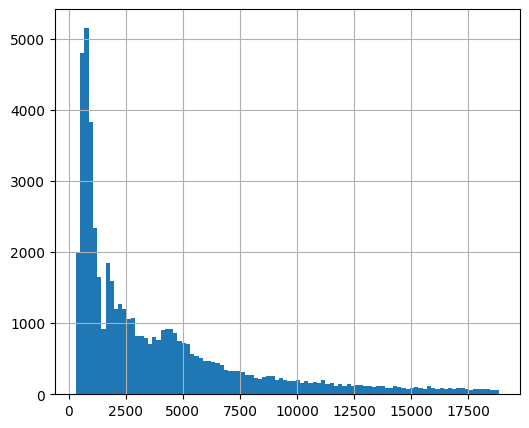

In [195]:
analysis(df, target_name=target[0], numerical_features=numerical_features)

In [196]:
df = df.drop_duplicates()

In [197]:
X = df.drop(columns=target).copy().values
y = df[target].copy().values

In [198]:
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
y = scaler.fit_transform(y)

In [199]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=seed, test_size=0.3)

## Обучаем модель линейной регрессии

In [200]:
reg = LinearRegression().fit(X_train, y_train)

In [201]:
y_pred = reg.predict(X_test)

In [202]:
score = r2_score(y_pred, y_test)

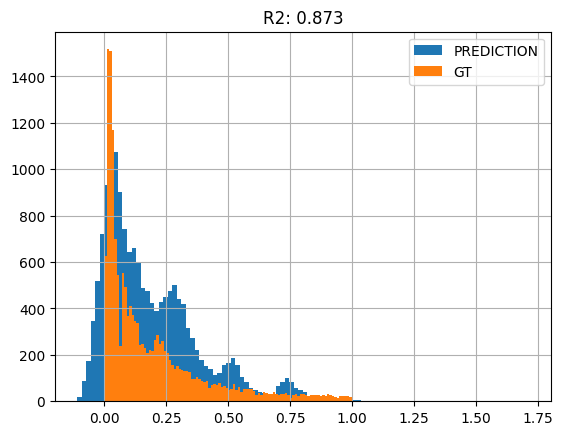

In [203]:
plt.title(f'R2: {str(score)[:5]}')
plt.hist(y_pred.reshape(1, -1)[0], bins=100, label='PREDICTION')
plt.hist(y_test.reshape(1, -1)[0], bins=100, label='GT')
plt.legend()
plt.grid();

Посмотрим, как справится нейронная сеть

## Задание 1: реализация слоев нейронной сети (3 балла)

Реализуйте следующие слои:


1.   Линейный слой (1 балл)
2.   Функция активации: ReLU (1 балл)
3.   Функция активации: Tanh (1 балл)

В линейном слое на методы прямого и обратных проходов навешаны декораторы: они понадобятся для следующего задания.



In [204]:
class Module:
    """
    Базовый класс для построения модулей нейронной сети.

    Attributes:
        forward_hook (Callable): Функция, которая будет вызываться после
                                 вычисления прямого прохода.

        backward_hook (Callable): Функция, которая будет вызываться после
                                  вычисления обратного прохода.

    Notes:
        Этот класс является абстрактным и не должен использоваться напрямую.
        Он предназначен для создания конкретных модулей нейронной сети, которые
        наследуются от него и реализуют необходимые методы.
    """

    def __init__(self):
        self.forward_hook = None
        self.backward_hook = None

    def register_forward_hook(self, forward_hook: Callable):
        """
        Метод для регистрации forward_hook
        """

        self.forward_hook = forward_hook

    def register_backward_hook(self, backward_hook: Callable):
        """
        Метод для регистрации backward_hook
        """

        self.backward_hook = backward_hook

    def forward(self, x: np.ndarray) -> np.ndarray:
        """
        Метод для прямого прохода

        Args:
            x (np.ndarray): Входные данные. Размерность может быть (batch_size,
              in_features) или (in_features,) для вектора.

        Returns:
            np.ndarray: Выходные данные после линейного преобразования
            (размерность: (batch_size, out_features) или (out_features,) для вектора).
        """
        pass

    def backward(self, gradient: np.ndarray) -> np.ndarray:
        """
        Метод для обратного прохода

        Args:
            gradient (np.ndarray): Градиент ошибки, полученный от следующего слоя.
            Размерность может быть (batch_size, out_features) или (out_features,)
            для вектора.

        Returns:
            np.ndarray: Градиент ошибки для предыдущего слоя
            (размерность: (batch_size, in_features) или (in_features,) для вектора).
        """
        pass

    def update(self, learning_rate: float) -> None:
        """
        Метод для обновления параметров модуля

        Args:
            learning_rate (float): Скорость обучения.
        """
        pass

Функции для расчета стандартного отклонения при прямом и обратных проходах

In [205]:
def forward_hook_std(input_, output):
    std = input_.std().item()
    print('forward', std)

def backward_hook_std(grad_input, grad_output):
    std = grad_input.std().item()
    print('\tbackward', std)

def execute_hook(hook_name: str) -> Callable:
    def decorator(func: Callable) -> Callable:
        def wrapper(self, x: Any) -> Any:
            output = func(self, x)
            hook = getattr(self, hook_name)
            hook(x, output)
            return output
        return wrapper
    return decorator

In [206]:
class Linear(Module):
    """
    Реализует полносвязный линейный слой.

    Этот слой выполняет линейное преобразование входных данных: y = xW + b,
    где W - матрица весов, b - вектор смещения, а x - входные данные.

    Args:
        in_features (int): Количество входных признаков.
        out_features (int): Количество выходных признаков.
    """

    def __init__(self, in_features: int, out_features: int):
        super().__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.bias = None
        self.weight = None

    @execute_hook(hook_name="forward_hook")
    def forward(self, x: np.ndarray) -> np.ndarray:
        self.x = x
        self.y = x @ self.weight.T + self.bias
        return self.y


    @execute_hook(hook_name="backward_hook")
    def backward(self, gradient: np.ndarray) -> np.ndarray:
        self.gradient_x = gradient @ self.weight
        if self.x.ndim == 1:
            self.gradient_W = gradient[np.newaxis, :].T @ self.x[np.newaxis, :]
        else:
            self.gradient_W = gradient.T @ self.x
        self.gradient_b = np.sum(gradient, axis=0)
        return self.gradient_x


    def update(self, learning_rate: float) -> None:
        self.weight -= learning_rate * self.gradient_W
        self.bias -= learning_rate * self.gradient_b

In [207]:
class ReLU(Module):
    def __init__(self):
        super().__init__()

    def forward(self, x: np.ndarray) -> np.ndarray:
        self.x = x
        self.y = np.maximum(x, 0)
        return self.y

    def backward(self, gradient: np.ndarray) -> np.ndarray:
        self.gradient_x = (self.x > 0) * gradient
        return self.gradient_x

In [208]:
class Tanh(Module):
    def __init__(self):
        super().__init__()

    def forward(self, x: np.ndarray) -> np.ndarray:
        self.x = x
        self.y = np.tanh(x)
        return self.y


    def backward(self, gradient: np.ndarray) -> np.ndarray:
        self.gradient_x = (1 - self.y ** 2) * gradient
        return self.gradient_x

## Задание 2: начальная инициализация (3 балла)

Необходимо реализовать следующие подходы к иницализации нейронной сети:

1. Инициализация случайными числами из нормального распределения (1 балл)
$$\mathbb{N}(0, \frac{1}{n_{in}})$$


2. Инициализация Xavier Glorot (1 балл)
$$U \left[ - \frac{\sqrt{6}}{\sqrt{n_{in}+n_{out}}}, \frac{\sqrt{6}}{\sqrt{n_{in}+n_{out}}}  \right ] $$


3. Инициализация Kaiming He (1 балл)
$$\mathbb{N}(0, \frac{2}{n_{in}})$$



In [209]:
def init_norm_layer(layer: Module) -> None:
    """
    Инициализирует веса и смещение.

    Args:
        layer (Linear): Экземпляр слоя, который необходимо инициализировать.

    Returns:
        None. Функция изменяет слой layer in-place.
    """
    layer.weight = np.random.randn(layer.out_features, layer.in_features) / np.sqrt(layer.in_features)
    layer.bias = np.random.randn(layer.out_features) / layer.in_features

In [210]:
def init_xavier_layer(layer: Module) -> None:
    """
    Инициализирует веса и смещение.

    Args:
        layer (Linear): Экземпляр слоя, который необходимо инициализировать.

    Returns:
        None. Функция изменяет слой layer in-place.
    """
    layer.weight = (np.random.rand(layer.out_features, layer.in_features) * 2 - 1) * np.sqrt(6 / (layer.in_features + layer.out_features))
    layer.bias = np.random.rand(layer.out_features) * np.sqrt(6 / (layer.in_features + layer.out_features))

In [211]:
def init_he_layer(layer: Module) -> None:
    """
    Инициализирует веса и смещение.

    Args:
        layer (Linear): Экземпляр слоя, который необходимо инициализировать.

    Returns:
        None. Функция изменяет слой layer in-place.
    """
    layer.weight = np.random.randn(layer.out_features, layer.in_features) * np.sqrt(2 / layer.in_features)
    layer.bias = np.random.randn(layer.out_features) * np.sqrt(2 / layer.in_features)

## Задание 3: MLP для задачи регрессии (4 балла)

Необходимо реализовать модель MLP для задачи регресcии

Для визуализации процесса обучения рекомендуется использовать модуль `tqdm`

In [212]:
from tqdm import tqdm

In [214]:
class MLPRegressor:
    """
    Класс MLP для задач регрессии.

    Attributes:
        init_func (function): Функция инициализации весов слоев.
            Принимает на вход слой и производит его инициализацию.
        hidden_layer_sizes (tuple): Размеры скрытых слоев.
        batch_size (int): Размер батча при обучении.
        learning_rate (float, optional): Скорость обучения.
        max_iter (int): Максимальное количество эпох обучения.
    """
    def __init__(self,
                 activation_function: Module,
                 init_func: Callable,
                 hidden_layer_sizes: tuple,
                 batch_size: int,
                 learning_rate: float,
                 max_iter: int):

        self.activation_function = activation_function
        self.init_func = init_func
        self.hidden_layer_sizes = hidden_layer_sizes
        self.batch_size = batch_size
        self.learning_rate = learning_rate
        self.max_iter = max_iter
        self.layers = None
        self.input_layer = None

    def __customize_layer(self, layer):
        """
        Настраивает слой перед добавлением в модель.

        Регистрирует хуки прямого и обратного прохода, а также инициализирует
        веса слоя с помощью self.init_func.

        Args:
            layer (Module): Слой для настройки.

        Returns:
            Module: Настроенный слой.
        """

        layer.register_forward_hook(forward_hook_std)
        layer.register_backward_hook(backward_hook_std)
        self.init_func(layer)
        return layer

    def train(self, X: np.ndarray, y: np.ndarray) -> None:
        """
        Обучает модель на заданных данных.

        Args:
            X (np.ndarray): Матрица входных данных.
            y (np.ndarray): Матрица целевых значений.
        """

        in_features = X.shape[1]
        out_features = y.shape[1]
        sizes = list(self.hidden_layer_sizes) + [out_features]
        self.input_layer = Linear(in_features=in_features, out_features=sizes[0])
        self.input_layer = self.__customize_layer(self.input_layer)
        self.layers = [self.activation_function]
        for j in range(len(sizes) - 1):
            layer = Linear(in_features=sizes[j], out_features=sizes[j + 1])
            layer = self.__customize_layer(layer)
            self.layers.append(layer)
            self.layers.append(self.activation_function)
        for epoch in tqdm(range(self.max_iter)):
            for i in range(0, len(X), self.batch_size):
                x_batch = X[i : i + self.batch_size]
                y_batch = y[i : i + self.batch_size]
                outp = self.input_layer.forward(x_batch)
                for layer in self.layers:
                    outp = layer.forward(outp)
                grad = -2 * (y_batch - outp) / y_batch.shape[0]
                for layer in reversed(self.layers):
                    grad = layer.backward(grad)
                    if layer.__class__.__name__ == 'Linear':
                        layer.update(self.learning_rate)
                grad = self.input_layer.backward(grad)
                self.input_layer.update(self.learning_rate)


    def predict(self, X: np.ndarray) -> np.ndarray:
        """
        Делает предсказание на заданных входных данных.

        Args:
            X (np.ndarray): Матрица входных данных.

        Returns:
            np.ndarray: Матрица предсказанных значений.
        """
        outp = self.input_layer.forward(X)
        for layer in self.layers:
            outp = layer.forward(outp)
        return outp

Используем функцию активации ReLU и инициализацию He:

In [221]:
mlp = MLPRegressor(activation_function=ReLU(), init_func=init_he_layer, hidden_layer_sizes=(), batch_size=32, learning_rate=0.01, max_iter=30)

In [216]:
mlp.train(X_train, y_train)

  0%|          | 0/30 [00:00<?, ?it/s]

forward 0.2563940430687895
	backward 0.007960331728883243
forward 0.2504506978782929
	backward 0.007956287494612696
forward 0.27039486158046483
	backward 0.004508089854976216
forward 0.25350696208446133
	backward 0.006348036559169056
forward 0.25600605183844727
	backward 0.008599163703719123
forward 0.2564341980742586
	backward 0.0037846868592038107
forward 0.2555476058478352
	backward 0.0015423115306440831
forward 0.2690303641128853
	backward 0.014184760841663575
forward 0.25781087300426025
	backward 0.003990330056872306
forward 0.2547249289090017
	backward 0.01297741484932153
forward 0.2589409436804652
	backward 0.008097371957682934
forward 0.26735571353993703
	backward 0.006508864090403047
forward 0.2774048133194631
	backward 0.0031530261986855534
forward 0.2589489461210871
	backward 0.01221661879661438
forward 0.25317241823642933
	backward 0.006582541041765436
forward 0.25570887796406533
	backward 0.008271003566166312
forward 0.24714610800128503
	backward 0.010265693950461768
forwa

  3%|▎         | 1/30 [00:01<00:49,  1.71s/it]

 0.25205151493105077
	backward 0.013542101858875617
forward 0.24335556351173301
	backward 0.00958878481911471
forward 0.2615215525059853
	backward 0.010863370411727384
forward 0.25970029983392284
	backward 0.012841044947683589
forward 0.252236348281036
	backward 0.01183710259911501
forward 0.24217657110528318
	backward 0.011453989674210772
forward 0.26496416780211957
	backward 0.014124404165943738
forward 0.2582748858788341
	backward 0.01362569158819494
forward 0.2575822005680822
	backward 0.01398192328624784
forward 0.26075206747888385
	backward 0.007495124641185543
forward 0.25958288508270666
	backward 0.013600343158584422
forward 0.2526800912172736
	backward 0.01278485837499758
forward 0.24744075149321673
	backward 0.013482319738534226
forward 0.2539307303925173
	backward 0.009277172632628802
forward 0.2608365143105357
	backward 0.011173718435390364
forward 0.25787488922988355
	backward 0.014782557846485871
forward 0.2595164991744427
	backward 0.011719721846179249
forward 0.26919945

  7%|▋         | 2/30 [00:03<00:41,  1.49s/it]

 0.24044777925520644
	backward 0.010229836275778309
forward 0.2794461900759415
	backward 0.010358959525241664
forward 0.24643601440307344
	backward 0.005515249148431208
forward 0.24474528306111026
	backward 0.009457347484051692
forward 0.24634491742919057
	backward 0.00730768613696025
forward 0.24795674713345645
	backward 0.00782314686256076
forward 0.24943461696535485
	backward 0.011510922583547028
forward 0.2585353784786537
	backward 0.012052337463724297
forward 0.2606755015620363
	backward 0.008747781439133562
forward 0.2530381453581673
	backward 0.007079364200112112
forward 0.24466561206943768
	backward 0.006227729324827419
forward 0.25286590237061835
	backward 0.00935279632880536
forward 0.2405573545714876
	backward 0.008311532401574898
forward 0.2510935686444156
	backward 0.007166207838296668
forward 0.23908504885953602
	backward 0.010881339074824062
forward 0.2556922914841736
	backward 0.009099765190264031
forward 0.25389170861945304
	backward 0.008371655911678084
forward 0.2542

 10%|█         | 3/30 [00:04<00:38,  1.44s/it]

forward 0.25938465480624795
	backward 0.0056778433194037605
forward 0.2693462689439588
	backward 0.002938222743489357
forward 0.2603064178108723
	backward 0.004067261475142366
forward 0.26372980981200067
	backward 0.005471028352262935
forward 0.2704648570238447
	backward 0.00808901132164154
forward 0.25342460550836127
	backward 0.00537037086274489
forward 0.2716241328983149
	backward 0.009385305162114676
forward 0.2644366348854607
	backward 0.007898568982878832
forward 0.2612393848596057
	backward 0.00880938433583264
forward 0.2589423753790616
	backward 0.00831812259667384
forward 0.2588262358633005
	backward 0.00818838117948548
forward 0.26440674826459415
	backward 0.008737691784202173
forward 0.26453106770977824
	backward 0.007161422016369643
forward 0.25240109484682205
	backward 0.006169811533705104
forward 0.27116521918880726
	backward 0.010377816535253517
forward 0.256304061320776
	backward 0.006078965388734466
forward 0.25451349988325617
	backward 0.005004522180842212
forward 0.2

 13%|█▎        | 4/30 [00:05<00:34,  1.31s/it]

 0.25692814880233134
	backward 0.006921437000252678
forward 0.2636681530622623
	backward 0.0037825681798035363
forward 0.247549802127252
	backward 0.006353575607870528
forward 0.26062272537508385
	backward 0.005499976204431584
forward 0.24510945226243658
	backward 0.009471081693388825
forward 0.26406751250225363
	backward 0.005745401917061938
forward 0.2620275896717071
	backward 0.0058837667767502565
forward 0.26296620359637324
	backward 0.0066352377393484804
forward 0.25043078405133523
	backward 0.0052879419328835985
forward 0.26007939323664997
	backward 0.004591000603581432
forward 0.27254600958678316
	backward 0.008479597697397544
forward 0.24560710246263442
	backward 0.005511361562616499
forward 0.2599571638229454
	backward 0.005688678723333117
forward 0.27499076482632107
	backward 0.005559041876189397
forward 0.25030374179313286
	backward 0.007205167718246531
forward 0.25305510336923964
	backward 0.008186704407294729
forward 0.24392512801051136
	backward 0.004166228948024124
forwa

 17%|█▋        | 5/30 [00:06<00:32,  1.29s/it]

 0.25370108945850417
	backward 0.005351539588913456
forward 0.2503358319127291
	backward 0.006289454556325884
forward 0.26575142581430755
	backward 0.007099900703617865
forward 0.2578484741640152
	backward 0.003335246293688863
forward 0.25107404031939445
	backward 0.0053711872911326175
forward 0.2617962999278566
	backward 0.004758196478195598
forward 0.25110772678670945
	backward 0.004566582679370379
forward 0.26099046112588636
	backward 0.006588696639012266
forward 0.2648931037972387
	backward 0.0053261905451062325
forward 0.24044777925520644
	backward 0.010187053666861127
forward 0.2794461900759415
	backward 0.007367699469570968
forward 0.24643601440307344
	backward 0.00335489795297678
forward 0.24474528306111026
	backward 0.00629291839369653
forward 0.24634491742919057
	backward 0.004727554276063008
forward 0.24795674713345645
	backward 0.0051603615809885355
forward 0.24943461696535485
	backward 0.008557227911767346
forward 0.2585353784786537
	backward 0.008924305609556595
forward 0

 20%|██        | 6/30 [00:07<00:29,  1.22s/it]

0.2585353784786537
	backward 0.008557018359236947
forward 0.2606755015620363
	backward 0.005761250124592927
forward 0.2530381453581673
	backward 0.004921000275653702
forward 0.24466561206943768
	backward 0.0034431665959474083
forward 0.25286590237061835
	backward 0.005917520187220421
forward 0.2405573545714876
	backward 0.005725870001890642
forward 0.2510935686444156
	backward 0.005210509077542774
forward 0.23908504885953602
	backward 0.006674289224103781
forward 0.2556922914841736
	backward 0.005198407447697332
forward 0.25389170861945304
	backward 0.005875095300515402
forward 0.2542642311863758
	backward 0.003911782525647342
forward 0.24814565832462354
	backward 0.004550130728018241
forward 0.26501958389114527
	backward 0.0037406031136944452
forward 0.26505137548389085
	backward 0.006455069554696905
forward 0.2593817225504797
	backward 0.005859799189107894
forward 0.268025990655742
	backward 0.0058660834398284074
forward 0.25031916835835194
	backward 0.0046572762581192605
forward 0.2

 23%|██▎       | 7/30 [00:11<00:44,  1.94s/it]

 0.25899303962576475
	backward 0.004987078310572201
forward 0.26034120944829964
	backward 0.0061756583099445645
forward 0.26051114367028955
	backward 0.006879968736472359
forward 0.2657118756951158
	backward 0.005119635746833871
forward 0.2554368066891601
	backward 0.0046871473371711
forward 0.25250586346810977
	backward 0.003488618440761735
forward 0.25474492511179053
	backward 0.003565196125709193
forward 0.24801017134844774
	backward 0.005495813946607161
forward 0.24431325007406346
	backward 0.005814739697465376
forward 0.2529870214577509
	backward 0.003769311126001158
forward 0.24000695893060447
	backward 0.0048206864710593125
forward 0.26511235865241306
	backward 0.003424830348231791
forward 0.26828140245104365
	backward 0.004150421847837712
forward 0.25698874100354036
	backward 0.003252246514247017
forward 0.2600752068499024
	backward 0.007070179450434377
forward 0.24821113417619434
	backward 0.0051517318601330825
forward 0.25605035634354806
	backward 0.0030416197078447873
forwar

 27%|██▋       | 8/30 [00:12<00:34,  1.57s/it]


forward 0.26955405895330536
	backward 0.00636127571266393
forward 0.25859539312382535
	backward 0.007780927448399014
forward 0.2542567895465083
	backward 0.006614411946742781
forward 0.26728277229531466
	backward 0.00730893790949458
forward 0.26013327449024826
	backward 0.004242194454751992
forward 0.25394757100481785
	backward 0.0036941722967433668
forward 0.26739446951376594
	backward 0.0051738693330784175
forward 0.2706792077971089
	backward 0.00540635082644581
forward 0.2667052655157447
	backward 0.004398469659867676
forward 0.25910237785429624
	backward 0.0036462097907965533
forward 0.25140493355078547
	backward 0.005114813878145351
forward 0.2552871772924373
	backward 0.009082846650334628
forward 0.2643268045088214
	backward 0.006075807149480207
forward 0.2507583693501516
	backward 0.0059611423155681706
forward 0.2517806686400694
	backward 0.005299164071908004
forward 0.2575516706483403
	backward 0.004134160648242825
forward 0.24782820877197997
	backward 0.0043589556684257595
fo

 30%|███       | 9/30 [00:13<00:30,  1.45s/it]

 0.2549644129715315
	backward 0.007252750411590715
forward 0.25205151493105077
	backward 0.006105856573678334
forward 0.24335556351173301
	backward 0.003979642138106427
forward 0.2615215525059853
	backward 0.00277877500467639
forward 0.25970029983392284
	backward 0.0034841225958230576
forward 0.252236348281036
	backward 0.004400482142456671
forward 0.24217657110528318
	backward 0.0052589878422604
forward 0.26496416780211957
	backward 0.005720390415919586
forward 0.2582748858788341
	backward 0.00511840996880396
forward 0.2575822005680822
	backward 0.007815337170431516
forward 0.26075206747888385
	backward 0.002542779706925393
forward 0.25958288508270666
	backward 0.0035160424225200906
forward 0.2526800912172736
	backward 0.004745106807416155
forward 0.24744075149321673
	backward 0.005653304061326427
forward 0.2539307303925173
	backward 0.0027955937218236628
forward 0.2608365143105357
	backward 0.00450384595193519
forward 0.25787488922988355
	backward 0.00970853052131457
forward 0.259516

 33%|███▎      | 10/30 [00:14<00:27,  1.35s/it]

 0.005158787749312366
forward 0.2603146115256559
	backward 0.004194142262862341
forward 0.2567183771503667
	backward 0.0036101229209592575
forward 0.26026173166072253
	backward 0.0028407801167964508
forward 0.2649739659367713
	backward 0.003256785069821354
forward 0.26033920506241587
	backward 0.006618151865877075
forward 0.2560970443690957
	backward 0.00399011641876771
forward 0.256003114617493
	backward 0.0026827539780669065
forward 0.255249424656691
	backward 0.005590465547697936
forward 0.25486875424681094
	backward 0.0038727359814644566
forward 0.2617552729222296
	backward 0.003170293239812538
forward 0.24750504856553454
	backward 0.0038249807068900573
forward 0.2610549636639978
	backward 0.005108433500357889
forward 0.2637084768533597
	backward 0.00778265177271881
forward 0.2621497850852887
	backward 0.003576437471221827
forward 0.2711887507830879
	backward 0.006303812932588752
forward 0.2540652745646504
	backward 0.004138309653117091
forward 0.24912785940299528
	backward 0.00333

 37%|███▋      | 11/30 [00:17<00:35,  1.86s/it]

forward 0.2563940430687895
	backward 0.004359832402923111
forward 0.2504506978782929
	backward 0.006519731308952796
forward 0.27039486158046483
	backward 0.0031271496263910025
forward 0.25350696208446133
	backward 0.005487781228578514
forward 0.25600605183844727
	backward 0.00609119056473757
forward 0.2564341980742586
	backward 0.0035035953150078162
forward 0.2555476058478352
	backward 0.0035646800041016996
forward 0.2690303641128853
	backward 0.004098562591989241
forward 0.25781087300426025
	backward 0.004813460324456457
forward 0.2547249289090017
	backward 0.006992741664757177
forward 0.2589409436804652
	backward 0.004087164793707118
forward 0.26735571353993703
	backward 0.0024728555779103046
forward 0.2774048133194631
	backward 0.005786988393356545
forward 0.2589489461210871
	backward 0.006405432961497542
forward 0.25317241823642933
	backward 0.004465703918435506
forward 0.25570887796406533
	backward 0.005407154422536311
forward 0.24714610800128503
	backward 0.0057164787233602386
fo

 40%|████      | 12/30 [00:22<00:49,  2.74s/it]


forward 0.257567979255592
	backward 0.0032649748265880223
forward 0.2532807025508994
	backward 0.004988429091291155
forward 0.24917379428598269
	backward 0.009549873441201912
forward 0.2563940430687895
	backward 0.004225915358637285
forward 0.2504506978782929
	backward 0.006386420176829192
forward 0.27039486158046483
	backward 0.0030987606080014013
forward 0.25350696208446133
	backward 0.00537102184855077
forward 0.25600605183844727
	backward 0.006023988684388171
forward 0.2564341980742586
	backward 0.00346298620896799
forward 0.2555476058478352
	backward 0.0035090112950310307
forward 0.2690303641128853
	backward 0.00396565788452888
forward 0.25781087300426025
	backward 0.0047137680371391434
forward 0.2547249289090017
	backward 0.007046763935287026
forward 0.2589409436804652
	backward 0.004064385766473571
forward 0.26735571353993703
	backward 0.0024082252000979546
forward 0.2774048133194631
	backward 0.005705952469432157
forward 0.2589489461210871
	backward 0.0063751810108226125
forwa

 43%|████▎     | 13/30 [00:25<00:48,  2.85s/it]

	backward 0.0037103866763351233
forward 0.2592890306477104
	backward 0.0026677396375129527
forward 0.26301548191885954
	backward 0.003888429257694993
forward 0.2545945268152221
	backward 0.005118512557848968
forward 0.2623440628059262
	backward 0.0050135161742989745
forward 0.25768274666527424
	backward 0.004223802827172572
forward 0.2505184008748501
	backward 0.004394270913720899
forward 0.2576643884998042
	backward 0.004981888406588408
forward 0.24798121923900157
	backward 0.005956994746527952
forward 0.25276569508188534
	backward 0.004129527262064069
forward 0.2516056313176957
	backward 0.004128479138214181
forward 0.2652569408619503
	backward 0.00694913881065578
forward 0.25897273954568895
	backward 0.00565871804700667
forward 0.2592332309640701
	backward 0.002380283259533869
forward 0.26411321715540625
	backward 0.002464578392330794
forward 0.24680167134631956
	backward 0.004613770766095368
forward 0.2532957354221835
	backward 0.0035583946579353896
forward 0.23328975080378322
	bac

 47%|████▋     | 14/30 [00:26<00:37,  2.33s/it]

 0.25605035634354806
	backward 0.00243592564949105
forward 0.24090827192852593
	backward 0.006217221303436691
forward 0.2531112420739963
	backward 0.002072054963490136
forward 0.26158204020784737
	backward 0.005091253082691631
forward 0.26922062851935186
	backward 0.003081499953489658
forward 0.24823752580087644
	backward 0.005655607070381694
forward 0.2592024531845413
	backward 0.00303278966739666
forward 0.2536019683903971
	backward 0.003852846829097447
forward 0.24956160802528032
	backward 0.006435858157405171
forward 0.2549644129715315
	backward 0.007290571464558478
forward 0.25205151493105077
	backward 0.005264815425047306
forward 0.24335556351173301
	backward 0.003787659051146665
forward 0.2615215525059853
	backward 0.0024393290549704675
forward 0.25970029983392284
	backward 0.0031022872183552788
forward 0.252236348281036
	backward 0.004363231842829629
forward 0.24217657110528318
	backward 0.005210425639881271
forward 0.26496416780211957
	backward 0.005648934406973892
forward 0.2

 50%|█████     | 15/30 [00:27<00:28,  1.93s/it]

 0.26033920506241587
	backward 0.0060379504950152495
forward 0.2560970443690957
	backward 0.003496267288986282
forward 0.256003114617493
	backward 0.0024972940598239433
forward 0.255249424656691
	backward 0.005631753887499986
forward 0.25486875424681094
	backward 0.003667900518431588
forward 0.2617552729222296
	backward 0.0028588080304783226
forward 0.24750504856553454
	backward 0.003614953910880907
forward 0.2610549636639978
	backward 0.0053181842213258996
forward 0.2637084768533597
	backward 0.00805614782366599
forward 0.2621497850852887
	backward 0.0032325592203733718
forward 0.2711887507830879
	backward 0.005901364765318458
forward 0.2540652745646504
	backward 0.004017162335987852
forward 0.24912785940299528
	backward 0.0029457696122371863
forward 0.25443299445418094
	backward 0.003731519211375364
forward 0.2442790771876521
	backward 0.007655752702170717
forward 0.26730730249181484
	backward 0.002842325409581859
forward 0.2551350012324216
	backward 0.004899955122185111
forward 0.24

 53%|█████▎    | 16/30 [00:28<00:23,  1.64s/it]


forward 0.25820363844585204
	backward 0.0029475783693439683
forward 0.26164278576489797
	backward 0.004846872938415394
forward 0.257567979255592
	backward 0.0030262926839504864
forward 0.2532807025508994
	backward 0.0046685233385620716
forward 0.24917379428598269
	backward 0.008975833507355565
forward 0.2563940430687895
	backward 0.004022967060957359
forward 0.2504506978782929
	backward 0.006015068923710781
forward 0.27039486158046483
	backward 0.003068671220991262
forward 0.25350696208446133
	backward 0.005018786156429815
forward 0.25600605183844727
	backward 0.005848097719859346
forward 0.2564341980742586
	backward 0.003274260753551865
forward 0.2555476058478352
	backward 0.0033321021374529865
forward 0.2690303641128853
	backward 0.0036252035286279487
forward 0.25781087300426025
	backward 0.004456762279730978
forward 0.2547249289090017
	backward 0.0072401489671326735
forward 0.2589409436804652
	backward 0.003924396662457927
forward 0.26735571353993703
	backward 0.0022888383013395987

 57%|█████▋    | 17/30 [00:30<00:21,  1.66s/it]


forward 0.26106612281608055
	backward 0.004217885387139914
forward 0.25344141027116424
	backward 0.003947918586618509
forward 0.26458892145640023
	backward 0.003490168696495847
forward 0.25092914323793813
	backward 0.003577363034723003
forward 0.25820363844585204
	backward 0.0028151035502758785
forward 0.26164278576489797
	backward 0.004821983588006978
forward 0.257567979255592
	backward 0.0030106364305776904
forward 0.2532807025508994
	backward 0.00461237187515975
forward 0.24917379428598269
	backward 0.00886908333486791
forward 0.2563940430687895
	backward 0.003993066663916591
forward 0.2504506978782929
	backward 0.005950253822539218
forward 0.27039486158046483
	backward 0.003070018804506015
forward 0.25350696208446133
	backward 0.004963423560466666
forward 0.25600605183844727
	backward 0.005819383450114473
forward 0.2564341980742586
	backward 0.0032512270288682405
forward 0.2555476058478352
	backward 0.0032934445466716263
forward 0.2690303641128853
	backward 0.0035701450358618914
f

 60%|██████    | 18/30 [00:33<00:27,  2.31s/it]

forward 0.25107404031939445
	backward 0.0038884835952720776
forward 0.2617962999278566
	backward 0.003676629815994843
forward 0.25110772678670945
	backward 0.003577379866898289
forward 0.26099046112588636
	backward 0.004470653052452805
forward 0.2648931037972387
	backward 0.00683738219487408
forward 0.24044777925520644
	backward 0.0044198884679753385
forward 0.2794461900759415
	backward 0.0056726806620562365
forward 0.24643601440307344
	backward 0.0029183765621187117
forward 0.24474528306111026
	backward 0.0034846752147734833
forward 0.24634491742919057
	backward 0.00327124177155074
forward 0.24795674713345645
	backward 0.003761047913723572
forward 0.24943461696535485
	backward 0.0071147159440734615
forward 0.2585353784786537
	backward 0.007480600710303757
forward 0.2606755015620363
	backward 0.004750499974899924
forward 0.2530381453581673
	backward 0.0033145344273816735
forward 0.24466561206943768
	backward 0.0032479337949852002
forward 0.25286590237061835
	backward 0.0044593807818275

 63%|██████▎   | 19/30 [00:37<00:30,  2.80s/it]

	backward 0.0029363616640281816
forward 0.24823752580087644
	backward 0.005374495645652506
forward 0.2592024531845413
	backward 0.0027514781720594313
forward 0.2536019683903971
	backward 0.003762407529297206
forward 0.24956160802528032
	backward 0.006116494323971475
forward 0.2549644129715315
	backward 0.0072629613807026405
forward 0.25205151493105077
	backward 0.004862137351352981
forward 0.24335556351173301
	backward 0.0035417548305973845
forward 0.2615215525059853
	backward 0.002339113854472364
forward 0.25970029983392284
	backward 0.0028029929208536106
forward 0.252236348281036
	backward 0.004386666816846393
forward 0.24217657110528318
	backward 0.0052743276656528355
forward 0.26496416780211957
	backward 0.005394397666017066
forward 0.2582748858788341
	backward 0.004131467328196256
forward 0.2575822005680822
	backward 0.0074587197566363325
forward 0.26075206747888385
	backward 0.002337625035464141
forward 0.25958288508270666
	backward 0.002942896492554309
forward 0.2526800912172736

 67%|██████▋   | 20/30 [00:39<00:24,  2.41s/it]

 0.25344141027116424
	backward 0.0039070589674606426
forward 0.26458892145640023
	backward 0.003338989863769381
forward 0.25092914323793813
	backward 0.0034701931278745077
forward 0.25820363844585204
	backward 0.0027738172793377765
forward 0.26164278576489797
	backward 0.004761778628426955
forward 0.257567979255592
	backward 0.002957840883769148
forward 0.2532807025508994
	backward 0.004424906482363848
forward 0.24917379428598269
	backward 0.008610046161501801
forward 0.2563940430687895
	backward 0.0038953860600737466
forward 0.2504506978782929
	backward 0.0058023656221565115
forward 0.27039486158046483
	backward 0.002883141713710625
forward 0.25350696208446133
	backward 0.004840314886079236
forward 0.25600605183844727
	backward 0.00572901103819065
forward 0.2564341980742586
	backward 0.0031920866310616272
forward 0.2555476058478352
	backward 0.003207275344980832
forward 0.2690303641128853
	backward 0.003449024401994828
forward 0.25781087300426025
	backward 0.004311015985345465
forward

 70%|███████   | 21/30 [00:40<00:17,  1.96s/it]

 0.003830683430913291
forward 0.2517784672178526
	backward 0.004134943803425456
forward 0.2540915876957397
	backward 0.002735538256809112
forward 0.2574615782326351
	backward 0.0028958274065142447
forward 0.2675009887411393
	backward 0.005830805136160019
forward 0.25431322532890227
	backward 0.004831077311719803
forward 0.2572522017647246
	backward 0.0040948702521262925
forward 0.2535587492590566
	backward 0.004866798448935288
forward 0.2632430988350331
	backward 0.006641311524697185
forward 0.25743781050980435
	backward 0.005133922766072382
forward 0.26106612281608055
	backward 0.00416385596329956
forward 0.25344141027116424
	backward 0.003895681479967656
forward 0.26458892145640023
	backward 0.0032995580763696877
forward 0.25092914323793813
	backward 0.003446044401065491
forward 0.25820363844585204
	backward 0.002763209767572224
forward 0.26164278576489797
	backward 0.004745694112244061
forward 0.257567979255592
	backward 0.0029537163953333384
forward 0.2532807025508994
	backward 0.0

 73%|███████▎  | 22/30 [00:40<00:12,  1.57s/it]

 0.004252352025103874
forward 0.23908504885953602
	backward 0.004556987802517322
forward 0.2556922914841736
	backward 0.003930832256495287
forward 0.25389170861945304
	backward 0.004055544484405007
forward 0.2542642311863758
	backward 0.0028499684818170234
forward 0.24814565832462354
	backward 0.003082532703323934
forward 0.26501958389114527
	backward 0.003284638004808728
forward 0.26505137548389085
	backward 0.005211309198635991
forward 0.2593817225504797
	backward 0.003845675136591096
forward 0.268025990655742
	backward 0.0053358308956986825
forward 0.25031916835835194
	backward 0.004504546184412989
forward 0.2617652865448884
	backward 0.00539349495563824
forward 0.2546996808442303
	backward 0.0023885676077048047
forward 0.2509701621991997
	backward 0.0033794012585178414
forward 0.2462735023866219
	backward 0.0044648370258508
forward 0.24941347754760945
	backward 0.002492527114634231
forward 0.27522952035596804
	backward 0.004442450349875602
forward 0.2626075364916071
	backward 0.002

 77%|███████▋  | 23/30 [00:41<00:09,  1.34s/it]


forward 0.2614073641312426
	backward 0.003091296916014488
forward 0.25216559173138364
	backward 0.0035397135863749945
forward 0.2618406073474862
	backward 0.0031386387246857095
forward 0.25195979156704923
	backward 0.0031049307956065816
forward 0.25729429799321596
	backward 0.00409520555749934
forward 0.25571078896832145
	backward 0.00460369060453027
forward 0.2556667589295486
	backward 0.004922939862995363
forward 0.27234530693425735
	backward 0.0025851513312423373
forward 0.2566402143318603
	backward 0.0029774410093573274
forward 0.24448723027665992
	backward 0.003370244688489966
forward 0.2546919537195288
	backward 0.003397545030963071
forward 0.2519571744344994
	backward 0.004547140436014572
forward 0.2689843460345138
	backward 0.003860762436549814
forward 0.2572347426123886
	backward 0.0037147149916190725
forward 0.25147926760162964
	backward 0.003150000492612609
forward 0.2631358754250725
	backward 0.005374694688462466
forward 0.24942869988830588
	backward 0.004035915330242899
f

 80%|████████  | 24/30 [00:42<00:06,  1.14s/it]


forward 0.26323282150193844
	backward 0.0028771291252114445
forward 0.25965210937593525
	backward 0.0034255185499186486
forward 0.24822800457818942
	backward 0.005847134695265095
forward 0.25225050839989716
	backward 0.003163246813928666
forward 0.26605842354940545
	backward 0.0035175852583162514
forward 0.2612463756073791
	backward 0.002472959770496303
forward 0.26895996242774156
	backward 0.003857457577962077
forward 0.2556066661802573
	backward 0.004032220230196768
forward 0.2514784112153866
	backward 0.0046409484880907455
forward 0.26196917477321174
	backward 0.005557323224385077
forward 0.2475124363240416
	backward 0.005477334952793602
forward 0.26579019496626144
	backward 0.0021808101052004807
forward 0.2660579163502123
	backward 0.010150318161806275
forward 0.24646377823188848
	backward 0.004361485602786144
forward 0.25118696551551345
	backward 0.0030603989507142163
forward 0.26367904837839967
	backward 0.0056530750351039116
forward 0.2676206347765238
	backward 0.00370488395541

 83%|████████▎ | 25/30 [00:43<00:05,  1.02s/it]


	backward 0.0041486451495477
forward 0.26416451088671616
	backward 0.002472089524538331
forward 0.25517058005443444
	backward 0.0027330632121970876
forward 0.24369153350753006
	backward 0.00364275376744329
forward 0.24148697420154142
	backward 0.004212773620334637
forward 0.25749502624038023
	backward 0.0023610392093489697
forward 0.26011458807145854
	backward 0.003007783227077121
forward 0.24691462866946057
	backward 0.00304399025769168
forward 0.24301161866118054
	backward 0.0029141538461587954
forward 0.25639603951188367
	backward 0.0027672768090972626
forward 0.26322183323469217
	backward 0.003561988859458383
forward 0.25755516921353244
	backward 0.004361839662108817
forward 0.25593272630857233
	backward 0.004360564181312317
forward 0.25702016300149205
	backward 0.005027889940960328
forward 0.26479743132297495
	backward 0.003854231304718048
forward 0.27318082661521803
	backward 0.0037535497355161446
forward 0.26787514478835983
	backward 0.0050689947080782465
forward 0.250016369342

 87%|████████▋ | 26/30 [00:46<00:06,  1.65s/it]


forward 0.23908504885953602
	backward 0.004466012799238782
forward 0.2556922914841736
	backward 0.003865517555525713
forward 0.25389170861945304
	backward 0.00394226171280228
forward 0.2542642311863758
	backward 0.0027932432104227157
forward 0.24814565832462354
	backward 0.003021135669711647
forward 0.26501958389114527
	backward 0.003206044020347537
forward 0.26505137548389085
	backward 0.005164631692448182
forward 0.2593817225504797
	backward 0.0037812461979579055
forward 0.268025990655742
	backward 0.005261881108042381
forward 0.25031916835835194
	backward 0.0045044482239831474
forward 0.2617652865448884
	backward 0.005331689920111148
forward 0.2546996808442303
	backward 0.002432110131958492
forward 0.2509701621991997
	backward 0.0033200037492952623
forward 0.2462735023866219
	backward 0.004379718585082484
forward 0.24941347754760945
	backward 0.0025069964724373527
forward 0.27522952035596804
	backward 0.004277644439789459
forward 0.2626075364916071
	backward 0.0025246011336127238
f

 90%|█████████ | 27/30 [00:49<00:05,  1.99s/it]

 0.257567979255592
	backward 0.002961122933177888
forward 0.2532807025508994
	backward 0.004207403559665982
forward 0.24917379428598269
	backward 0.008230551637746022
forward 0.2563940430687895
	backward 0.003805345609527339
forward 0.2504506978782929
	backward 0.0056165722390031795
forward 0.27039486158046483
	backward 0.002897210300437666
forward 0.25350696208446133
	backward 0.00469972383119726
forward 0.25600605183844727
	backward 0.005620840713205443
forward 0.2564341980742586
	backward 0.003093990606232874
forward 0.2555476058478352
	backward 0.0031214704812797204
forward 0.2690303641128853
	backward 0.003267051945886338
forward 0.25781087300426025
	backward 0.00414590760751533
forward 0.2547249289090017
	backward 0.007521024221041562
forward 0.2589409436804652
	backward 0.0037091413671720445
forward 0.26735571353993703
	backward 0.0021324622364816306
forward 0.2774048133194631
	backward 0.005130263739071945
forward 0.2589489461210871
	backward 0.006033680970454898
forward 0.2531

 93%|█████████▎| 28/30 [00:51<00:04,  2.27s/it]

 0.003763019073573688
forward 0.24956160802528032
	backward 0.005806494073481917
forward 0.2549644129715315
	backward 0.007312346762461341
forward 0.25205151493105077
	backward 0.004549780710023524
forward 0.24335556351173301
	backward 0.003342679438973107
forward 0.2615215525059853
	backward 0.0022567473638290697
forward 0.25970029983392284
	backward 0.00258250160226328
forward 0.252236348281036
	backward 0.00438083821566585
forward 0.24217657110528318
	backward 0.00523729854303168
forward 0.26496416780211957
	backward 0.005281581100301593
forward 0.2582748858788341
	backward 0.0037394707426949016
forward 0.2575822005680822
	backward 0.00733718505525493
forward 0.26075206747888385
	backward 0.0022216071914989543
forward 0.25958288508270666
	backward 0.0028059906059528395
forward 0.2526800912172736
	backward 0.004114621196750589
forward 0.24744075149321673
	backward 0.004677919968227608
forward 0.2539307303925173
	backward 0.0023059130998972165
forward 0.2608365143105357
	backward 0.00

 97%|█████████▋| 29/30 [00:53<00:02,  2.13s/it]

 0.0024414705520075758
forward 0.25370108945850417
	backward 0.002798901315731283
forward 0.2503358319127291
	backward 0.004306702704579216
forward 0.26575142581430755
	backward 0.004388310569697794
forward 0.2578484741640152
	backward 0.0025804585279820143
forward 0.25107404031939445
	backward 0.003675612676429069
forward 0.2617962999278566
	backward 0.003514566768631141
forward 0.25110772678670945
	backward 0.0036810098655989686
forward 0.26099046112588636
	backward 0.004122673899272195
forward 0.2648931037972387
	backward 0.007407506690469297
forward 0.24044777925520644
	backward 0.00389939069116596
forward 0.2794461900759415
	backward 0.005470630721478081
forward 0.24643601440307344
	backward 0.00302357619519912
forward 0.24474528306111026
	backward 0.0029172151242598133
forward 0.24634491742919057
	backward 0.002891095750147496
forward 0.24795674713345645
	backward 0.0035281967370543285
forward 0.24943461696535485
	backward 0.006896483979108989
forward 0.2585353784786537
	backward

100%|██████████| 30/30 [00:54<00:00,  1.82s/it]

 0.2648931037972387
	backward 0.007418887496241028
forward 0.24044777925520644
	backward 0.0038743047768693833
forward 0.2794461900759415
	backward 0.005461864258672029
forward 0.24643601440307344
	backward 0.0030320088926941604
forward 0.24474528306111026
	backward 0.002886627082956377
forward 0.24634491742919057
	backward 0.002870612639512761
forward 0.24795674713345645
	backward 0.0035090187423228855
forward 0.24943461696535485
	backward 0.006883321677812249
forward 0.2585353784786537
	backward 0.00741330852649333
forward 0.2606755015620363
	backward 0.004665129810594627
forward 0.2530381453581673
	backward 0.0030078269554059227
forward 0.24466561206943768
	backward 0.00325931178770077
forward 0.25286590237061835
	backward 0.004204689314953749
forward 0.2405573545714876
	backward 0.004229770171880654
forward 0.2510935686444156
	backward 0.004200633818349679
forward 0.23908504885953602
	backward 0.0044164777511330406
forward 0.2556922914841736
	backward 0.0038176499594973737
forward 

Дисперсия меняется незначительно.

Проверяем модель MLP на выборке Diamonds

In [217]:
y_pred = mlp.predict(X_test)
score = r2_score(y_test, y_pred)

forward 0.2580433992619139


In [218]:
score

0.8978462711740609

Используем функцию активации ReLU и инициализацию Xavier:

In [222]:
mlp2 = MLPRegressor(activation_function=ReLU(), init_func=init_xavier_layer, hidden_layer_sizes=(), batch_size=32, learning_rate=0.01, max_iter=30)

In [223]:
mlp2.train(X_train, y_train)

  0%|          | 0/30 [00:00<?, ?it/s]

forward 0.2563940430687895
	backward 0.009324705345823536
forward 0.2504506978782929
	backward 0.01444682399513167
forward 0.27039486158046483
	backward 0.008397405376213139
forward 0.25350696208446133
	backward 0.012385084592479044
forward 0.25600605183844727
	backward 0.01364789695843529
forward 0.2564341980742586
	backward 0.008333011258199952
forward 0.2555476058478352
	backward 0.011769390320434706
forward 0.2690303641128853
	backward 0.012396047514453945
forward 0.25781087300426025
	backward 0.011698018340854353
forward 0.2547249289090017
	backward 0.01106269218736101
forward 0.2589409436804652
	backward 0.008223577563748044
forward 0.26735571353993703
	backward 0.006235403111139167
forward 0.2774048133194631
	backward 0.011088179990291491
forward 0.2589489461210871
	backward 0.012486594289750675
forward 0.25317241823642933
	backward 0.007338597215317421
forward 0.25570887796406533
	backward 0.013572154864128924
forward 0.24714610800128503
	backward 0.013645212449598109
forward 0

  3%|▎         | 1/30 [00:00<00:23,  1.22it/s]

 0.25210141633311767
	backward 0.006754281949035691
forward 0.2525635908126518
	backward 0.007230701148776866
forward 0.27124374987198746
	backward 0.007210650550033235
forward 0.2649716800883769
	backward 0.005271315863223156
forward 0.25575495420433214
	backward 0.004787049658484878
forward 0.24351695525193492
	backward 0.00444581462590606
forward 0.2544014820462891
	backward 0.005505290902584447
forward 0.26034320816113327
	backward 0.006674314886684117
forward 0.2598031429286647
	backward 0.0065794277419758095
forward 0.2628485756034551
	backward 0.005849085847422879
forward 0.26323282150193844
	backward 0.004003490381657717
forward 0.25965210937593525
	backward 0.008428094047054307
forward 0.24822800457818942
	backward 0.008514269319992756
forward 0.25225050839989716
	backward 0.0055483246737240074
forward 0.26605842354940545
	backward 0.006435571192312563
forward 0.2612463756073791
	backward 0.004478958496855708
forward 0.26895996242774156
	backward 0.0072029764163141444
forward 

  7%|▋         | 2/30 [00:01<00:23,  1.17it/s]

 0.004674656317597647
forward 0.26323282150193844
	backward 0.0027335624857191742
forward 0.25965210937593525
	backward 0.006535939591235681
forward 0.24822800457818942
	backward 0.007372022910725908
forward 0.25225050839989716
	backward 0.0039946814590926276
forward 0.26605842354940545
	backward 0.005499908707795516
forward 0.2612463756073791
	backward 0.0033077022771613816
forward 0.26895996242774156
	backward 0.0055374281951978965
forward 0.2556066661802573
	backward 0.00550659028465804
forward 0.2514784112153866
	backward 0.005625508694364368
forward 0.26196917477321174
	backward 0.009060395942706558
forward 0.2475124363240416
	backward 0.007022679595452505
forward 0.26579019496626144
	backward 0.0031209312790488547
forward 0.2660579163502123
	backward 0.0068886335224749955
forward 0.24646377823188848
	backward 0.005853587964876348
forward 0.25118696551551345
	backward 0.005592406592411518
forward 0.26367904837839967
	backward 0.00778633740275252
forward 0.2676206347765238
	backwar

 10%|█         | 3/30 [00:02<00:21,  1.28it/s]

 0.2521197200039554
	backward 0.006923459417932345
forward 0.26423279786171516
	backward 0.0021358916131531567
forward 0.26314236683776304
	backward 0.004632442552010503
forward 0.271081909243203
	backward 0.005168621385311692
forward 0.24932655271825319
	backward 0.003472117928065954
forward 0.2537273148138818
	backward 0.003474505758933017
forward 0.2600887911752957
	backward 0.002928173981712611
forward 0.27165271057373525
	backward 0.006038015250364599
forward 0.25274773190265465
	backward 0.005750854322292823
forward 0.2647532235569123
	backward 0.003819429842203433
forward 0.2463053647954933
	backward 0.004527507131546748
forward 0.26416451088671616
	backward 0.0018545932468018945
forward 0.25517058005443444
	backward 0.003935382379775471
forward 0.24369153350753006
	backward 0.00445060150712789
forward 0.24148697420154142
	backward 0.004098263281354099
forward 0.25749502624038023
	backward 0.0019983253659227856
forward 0.26011458807145854
	backward 0.0038520997761235963
forward 

 13%|█▎        | 4/30 [00:03<00:21,  1.23it/s]

 0.25726705559075363
	backward 0.005177787524310354
forward 0.26449698786261133
	backward 0.00645531044929154
forward 0.25417601673843815
	backward 0.0037459822428520793
forward 0.25210141633311767
	backward 0.005186010756842778
forward 0.2525635908126518
	backward 0.005329591551088293
forward 0.27124374987198746
	backward 0.005551315063988162
forward 0.2649716800883769
	backward 0.004195922974941661
forward 0.25575495420433214
	backward 0.0029545089454934242
forward 0.24351695525193492
	backward 0.002735112119219773
forward 0.2544014820462891
	backward 0.004411758732845971
forward 0.26034320816113327
	backward 0.004621603343431488
forward 0.2598031429286647
	backward 0.003912601917572616
forward 0.2628485756034551
	backward 0.004110998905909086
forward 0.26323282150193844
	backward 0.0026711811870782113
forward 0.25965210937593525
	backward 0.005317093323566155
forward 0.24822800457818942
	backward 0.00674221497683659
forward 0.25225050839989716
	backward 0.003343255080218778
forward 

 17%|█▋        | 5/30 [00:05<00:33,  1.32s/it]

 0.005252914175722779
forward 0.2540915876957397
	backward 0.0041958012868313094
forward 0.2574615782326351
	backward 0.003263776927730455
forward 0.2675009887411393
	backward 0.007372137075170902
forward 0.25431322532890227
	backward 0.004968002108102268
forward 0.2572522017647246
	backward 0.004657351440408831
forward 0.2535587492590566
	backward 0.005376055953189383
forward 0.2632430988350331
	backward 0.007596535981139188
forward 0.25743781050980435
	backward 0.0055284669394307555
forward 0.26106612281608055
	backward 0.004307015191552945
forward 0.25344141027116424
	backward 0.003697662010226441
forward 0.26458892145640023
	backward 0.004161742607496851
forward 0.25092914323793813
	backward 0.005013826971512119
forward 0.25820363844585204
	backward 0.002950719424462212
forward 0.26164278576489797
	backward 0.004402886691761871
forward 0.257567979255592
	backward 0.0039800701909303085
forward 0.2532807025508994
	backward 0.0051162064439742635
forward 0.24917379428598269
	backward 0

 20%|██        | 6/30 [00:06<00:28,  1.19s/it]

0.2546996808442303
	backward 0.002652971180645931
forward 0.2509701621991997
	backward 0.003634767106497847
forward 0.2462735023866219
	backward 0.004871204107143957
forward 0.24941347754760945
	backward 0.0029132365530393136
forward 0.27522952035596804
	backward 0.005368942673472097
forward 0.2626075364916071
	backward 0.0034916489915006645
forward 0.26450154733162073
	backward 0.005073684937188789
forward 0.26533669619453815
	backward 0.005187027894581963
forward 0.25119299369341747
	backward 0.0054203249876987
forward 0.23755427650352567
	backward 0.004417540433599845
forward 0.2517784672178526
	backward 0.005012072877328041
forward 0.2540915876957397
	backward 0.003762237355808904
forward 0.2574615782326351
	backward 0.0032102657879600027
forward 0.2675009887411393
	backward 0.007060408966621836
forward 0.25431322532890227
	backward 0.004844792788616322
forward 0.2572522017647246
	backward 0.004483434451665815
forward 0.2535587492590566
	backward 0.00526068943636207
forward 0.26324

 23%|██▎       | 7/30 [00:07<00:23,  1.02s/it]

 0.004752513676275287
forward 0.25240109484682205
	backward 0.00425048137384382
forward 0.27116521918880726
	backward 0.0071756532352377075
forward 0.256304061320776
	backward 0.002617788803822415
forward 0.25451349988325617
	backward 0.00296920449561192
forward 0.26823719218599607
	backward 0.0072709428334946586
forward 0.2622439743205396
	backward 0.003095521874139733
forward 0.242185971427505
	backward 0.0031897602294613126
forward 0.25370108945850417
	backward 0.003748391108679282
forward 0.2503358319127291
	backward 0.0045804942962935245
forward 0.26575142581430755
	backward 0.00546726753113255
forward 0.2578484741640152
	backward 0.0034610504701067324
forward 0.25107404031939445
	backward 0.0037409443462186253
forward 0.2617962999278566
	backward 0.0031043728319172866
forward 0.25110772678670945
	backward 0.004434532506106217
forward 0.26099046112588636
	backward 0.004818720232335424
forward 0.2648931037972387
	backward 0.005087403188620596
forward 0.24044777925520644
	backward 0

 27%|██▋       | 8/30 [00:07<00:21,  1.03it/s]

 0.2632430988350331
	backward 0.007180900703250845
forward 0.25743781050980435
	backward 0.005253181834864096
forward 0.26106612281608055
	backward 0.0037755822768323942
forward 0.25344141027116424
	backward 0.003382369210467491
forward 0.26458892145640023
	backward 0.003643671985132958
forward 0.25092914323793813
	backward 0.0044410356489081836
forward 0.25820363844585204
	backward 0.0027101397766822605
forward 0.26164278576489797
	backward 0.0043091607295304936
forward 0.257567979255592
	backward 0.0036965029313188813
forward 0.2532807025508994
	backward 0.004737091367298244
forward 0.24917379428598269
	backward 0.008853825808712915
forward 0.2563940430687895
	backward 0.004285602341887754
forward 0.2504506978782929
	backward 0.006555139255435709
forward 0.27039486158046483
	backward 0.0036376269800196806
forward 0.25350696208446133
	backward 0.005488929833509658
forward 0.25600605183844727
	backward 0.006074741063726983
forward 0.2564341980742586
	backward 0.00298532192162176
forwar

 30%|███       | 9/30 [00:08<00:18,  1.11it/s]

 0.007665647352663062
forward 0.2691994556817844
	backward 0.003998942747029683
forward 0.26759452537931083
	backward 0.003256789610586242
forward 0.2347466683757601
	backward 0.006431595132186263
forward 0.2560383493973269
	backward 0.004467630166681136
forward 0.2553253835068212
	backward 0.005469891260624522
forward 0.2617168652923044
	backward 0.004431073564346999
forward 0.2601725947266099
	backward 0.003762387119831984
forward 0.25439873731678797
	backward 0.0033200707215933155
forward 0.2719126002801844
	backward 0.004578453980366468
forward 0.2513413985677664
	backward 0.004097186286788559
forward 0.24665238454322302
	backward 0.004535427662221932
forward 0.2521524201607881
	backward 0.004933660064203989
forward 0.25177810936564043
	backward 0.006153105549087694
forward 0.25938465480624795
	backward 0.003607272504551339
forward 0.2693462689439588
	backward 0.003511314014536175
forward 0.2603064178108723
	backward 0.002870536937981844
forward 0.26372980981200067
	backward 0.0035

 33%|███▎      | 10/30 [00:12<00:33,  1.70s/it]


	backward 0.004577772680809062
forward 0.2572522017647246
	backward 0.004033478753225397
forward 0.2535587492590566
	backward 0.004938887736693574
forward 0.2632430988350331
	backward 0.007008090070411709
forward 0.25743781050980435
	backward 0.005139897641695533
forward 0.26106612281608055
	backward 0.0036145820789091573
forward 0.25344141027116424
	backward 0.003302975097258431
forward 0.26458892145640023
	backward 0.0034495561007327163
forward 0.25092914323793813
	backward 0.004204762970666028
forward 0.25820363844585204
	backward 0.002593236628191445
forward 0.26164278576489797
	backward 0.004307568937154796
forward 0.257567979255592
	backward 0.003622323118801556
forward 0.2532807025508994
	backward 0.004609543785266842
forward 0.24917379428598269
	backward 0.008518015278487445
forward 0.2563940430687895
	backward 0.0041660986593444705
forward 0.2504506978782929
	backward 0.006311310921656452
forward 0.27039486158046483
	backward 0.00353849763226363
forward 0.25350696208446133
	b

 37%|███▋      | 11/30 [00:17<00:53,  2.82s/it]

forward 0.25286590237061835
	backward 0.004900086392474296
forward 0.2405573545714876
	backward 0.004210174211026547
forward 0.2510935686444156
	backward 0.004037035229457173
forward 0.23908504885953602
	backward 0.005567065063280056
forward 0.2556922914841736
	backward 0.0038136759915992275
forward 0.25389170861945304
	backward 0.004414711414248001
forward 0.2542642311863758
	backward 0.0031445632396847178
forward 0.24814565832462354
	backward 0.0037402062670978
forward 0.26501958389114527
	backward 0.0031334492320477672
forward 0.26505137548389085
	backward 0.005491380518299941
forward 0.2593817225504797
	backward 0.004541440790428111
forward 0.268025990655742
	backward 0.005543084040009553
forward 0.25031916835835194
	backward 0.003988242712615924
forward 0.2617652865448884
	backward 0.005388981243013706
forward 0.2546996808442303
	backward 0.0025989805276457204
forward 0.2509701621991997
	backward 0.003352976087385174
forward 0.2462735023866219
	backward 0.004396677563478887
forwar

 40%|████      | 12/30 [00:19<00:47,  2.66s/it]

0.0031075612886053354
forward 0.25140493355078547
	backward 0.005010290025514366
forward 0.2552871772924373
	backward 0.0068154429593712575
forward 0.2643268045088214
	backward 0.0042298136642373195
forward 0.2507583693501516
	backward 0.00446821784743004
forward 0.2517806686400694
	backward 0.004792512664636636
forward 0.2575516706483403
	backward 0.0028496260381870066
forward 0.24782820877197997
	backward 0.0033629055585783236
forward 0.26839851709435614
	backward 0.0026947100010889934
forward 0.26510938097327763
	backward 0.004448820457864908
forward 0.26578058846495034
	backward 0.003426581673773764
forward 0.24774611729336754
	backward 0.004901515251964
forward 0.2711211745572531
	backward 0.0026565408865959687
forward 0.25185858543933654
	backward 0.0037924932761857666
forward 0.26976348391473365
	backward 0.002611880072150955
forward 0.24953557757769623
	backward 0.005733640403764671
forward 0.2508436731870267
	backward 0.0034979466203851083
forward 0.2565185366048712
	backward 

 43%|████▎     | 13/30 [00:20<00:35,  2.09s/it]

 0.004644195012454692
forward 0.25859539312382535
	backward 0.006628309135362622
forward 0.2542567895465083
	backward 0.005655545701406167
forward 0.26728277229531466
	backward 0.0061970400882967866
forward 0.26013327449024826
	backward 0.003503421480955074
forward 0.25394757100481785
	backward 0.0031032414932392295
forward 0.26739446951376594
	backward 0.005172959617115485
forward 0.2706792077971089
	backward 0.0042892568051608035
forward 0.2667052655157447
	backward 0.004120102897773244
forward 0.25910237785429624
	backward 0.0030872759579256745
forward 0.25140493355078547
	backward 0.004983311530962502
forward 0.2552871772924373
	backward 0.006748780590484973
forward 0.2643268045088214
	backward 0.004208266463928462
forward 0.2507583693501516
	backward 0.004410268294143017
forward 0.2517806686400694
	backward 0.004844160961878333
forward 0.2575516706483403
	backward 0.0028383780918711313
forward 0.24782820877197997
	backward 0.003329662356022975
forward 0.26839851709435614
	backward

 47%|████▋     | 14/30 [00:21<00:28,  1.76s/it]

 0.004104553745440642
forward 0.2514784112153866
	backward 0.003989756660451928
forward 0.26196917477321174
	backward 0.006075123048369441
forward 0.2475124363240416
	backward 0.005315677189674026
forward 0.26579019496626144
	backward 0.001734244358685901
forward 0.2660579163502123
	backward 0.008433524983603223
forward 0.24646377823188848
	backward 0.004150508794664444
forward 0.25118696551551345
	backward 0.0030927508423692685
forward 0.26367904837839967
	backward 0.005707788808686331
forward 0.2676206347765238
	backward 0.004069241056418887
forward 0.25718581380670164
	backward 0.004065109858131863
forward 0.25304813322067227
	backward 0.004016492735092499
forward 0.24620938605181492
	backward 0.002846164384835159
forward 0.257346661238248
	backward 0.0029507674403092083
forward 0.2558445973453766
	backward 0.004147279536495542
forward 0.2538780566992934
	backward 0.004531742908239706
forward 0.26047879866450024
	backward 0.005907616823654491
forward 0.2589060390259058
	backward 0.0

 50%|█████     | 15/30 [00:22<00:21,  1.43s/it]

 0.003081092979589244
forward 0.2526800912172736
	backward 0.004015980639721649
forward 0.24744075149321673
	backward 0.004952190312324925
forward 0.2539307303925173
	backward 0.0022246393099646716
forward 0.2608365143105357
	backward 0.00520739775837619
forward 0.25787488922988355
	backward 0.0044698619475594375
forward 0.2595164991744427
	backward 0.007666742819013863
forward 0.2691994556817844
	backward 0.0036932104364642043
forward 0.26759452537931083
	backward 0.002987013494878081
forward 0.2347466683757601
	backward 0.006107031581114777
forward 0.2560383493973269
	backward 0.004503806017077764
forward 0.2553253835068212
	backward 0.004970538285845206
forward 0.2617168652923044
	backward 0.003945854145629062
forward 0.2601725947266099
	backward 0.0034667467108175248
forward 0.25439873731678797
	backward 0.0031248693960624885
forward 0.2719126002801844
	backward 0.004547154591684108
forward 0.2513413985677664
	backward 0.004053329803194434
forward 0.24665238454322302
	backward 0.00

 53%|█████▎    | 16/30 [00:22<00:16,  1.20s/it]

 0.004797876049367611
forward 0.2593904728070429
	backward 0.003993698971588886
forward 0.2562577391111532
	backward 0.004851876846340087
forward 0.24315628009030496
	backward 0.005364526852701168
forward 0.2548401933663812
	backward 0.0035059481332225194
forward 0.24861338507887096
	backward 0.004709741025700286
forward 0.24927562207722212
	backward 0.003594862896869109
forward 0.254848405547917
	backward 0.0051556684387210104
forward 0.26068970795633867
	backward 0.0036958299854791044
forward 0.24777359527777346
	backward 0.00307872853327729
forward 0.26238879098962586
	backward 0.0036540318381948133
forward 0.257130043757516
	backward 0.004885705385061182
forward 0.2520698025942563
	backward 0.004018552335640992
forward 0.269284579955103
	backward 0.0073446177404248355
forward 0.24966855616363506
	backward 0.0029833575248067036
forward 0.26471438484569243
	backward 0.003926461859451915
forward 0.2668704253921286
	backward 0.004838342004679936
forward 0.2727659456555282
	backward 0.0

 57%|█████▋    | 17/30 [00:24<00:17,  1.36s/it]

	backward 0.003266304379470801
forward 0.24474528306111026
	backward 0.0029317073635841406
forward 0.24634491742919057
	backward 0.0026543406435109384
forward 0.24795674713345645
	backward 0.0032923151694261043
forward 0.24943461696535485
	backward 0.006532458776224326
forward 0.2585353784786537
	backward 0.007822702792003033
forward 0.2606755015620363
	backward 0.005029445764994417
forward 0.2530381453581673
	backward 0.0028577761909801764
forward 0.24466561206943768
	backward 0.0033537084905294213
forward 0.25286590237061835
	backward 0.004570389064339593
forward 0.2405573545714876
	backward 0.004061555067228391
forward 0.2510935686444156
	backward 0.003965195440862486
forward 0.23908504885953602
	backward 0.0051272456101965035
forward 0.2556922914841736
	backward 0.003683546263963232
forward 0.25389170861945304
	backward 0.004060534134342024
forward 0.2542642311863758
	backward 0.0030222776479116613
forward 0.24814565832462354
	backward 0.0034795659118386398
forward 0.26501958389114

 60%|██████    | 18/30 [00:28<00:24,  2.01s/it]


forward 0.24474528306111026
	backward 0.002892530193888566
forward 0.24634491742919057
	backward 0.0026632200526774323
forward 0.24795674713345645
	backward 0.00328351778596554
forward 0.24943461696535485
	backward 0.006524301289741384
forward 0.2585353784786537
	backward 0.007808570985610523
forward 0.2606755015620363
	backward 0.005014312318734163
forward 0.2530381453581673
	backward 0.0028365317938058828
forward 0.24466561206943768
	backward 0.003351555474159792
forward 0.25286590237061835
	backward 0.004543170219380509
forward 0.2405573545714876
	backward 0.004051452279954877
forward 0.2510935686444156
	backward 0.0039642872048411765
forward 0.23908504885953602
	backward 0.005087372212480961
forward 0.2556922914841736
	backward 0.0036751525380545034
forward 0.25389170861945304
	backward 0.004032251711979363
forward 0.2542642311863758
	backward 0.0029329317658778526
forward 0.24814565832462354
	backward 0.003461199070646872
forward 0.26501958389114527
	backward 0.003124989602080550

 63%|██████▎   | 19/30 [00:32<00:29,  2.66s/it]

forward 0.2617652865448884
	backward 0.005262603883924501
forward 0.2546996808442303
	backward 0.002739586569111571
forward 0.2509701621991997
	backward 0.0032348692128825133
forward 0.2462735023866219
	backward 0.004085781541684829
forward 0.24941347754760945
	backward 0.002749328859199566
forward 0.27522952035596804
	backward 0.004086005249777328
forward 0.2626075364916071
	backward 0.002224877465147004
forward 0.26450154733162073
	backward 0.005073793563944802
forward 0.26533669619453815
	backward 0.0053618852974584635
forward 0.25119299369341747
	backward 0.004824115632439195
forward 0.23755427650352567
	backward 0.003984694624960171
forward 0.2517784672178526
	backward 0.003879051459008255
forward 0.2540915876957397
	backward 0.003132301161500046
forward 0.2574615782326351
	backward 0.003180960029479594
forward 0.2675009887411393
	backward 0.005363701199754837
forward 0.25431322532890227
	backward 0.004450241599940014
forward 0.2572522017647246
	backward 0.0036236798139390883
forw

 67%|██████▋   | 20/30 [00:34<00:24,  2.49s/it]

 0.24897447232038344
	backward 0.004063642231901134
forward 0.24678449745832154
	backward 0.004508161427816002
forward 0.26469382996152785
	backward 0.005372795434281437
forward 0.26229021823868753
	backward 0.004220235961514646
forward 0.2653141492053324
	backward 0.004299112836819658
forward 0.2594716206436094
	backward 0.00410239293547739
forward 0.2627703665302174
	backward 0.002894605499946268
forward 0.2601924937044562
	backward 0.0038301701713443583
forward 0.26332524902494286
	backward 0.005198614330709436
forward 0.2654900167273496
	backward 0.006164329633123787
forward 0.2631417937447539
	backward 0.004489036036600579
forward 0.254888766294779
	backward 0.0025342070755075604
forward 0.2518838894223029
	backward 0.00491349449701255
forward 0.24818457938097957
	backward 0.00464229000414965
forward 0.26597684490445805
	backward 0.0030714922348235637
forward 0.27868155048332893
	backward 0.002657851577529857
forward 0.2627617512785608
	backward 0.0031635327075717266
forward 0.250

 70%|███████   | 21/30 [00:35<00:19,  2.17s/it]

	backward 0.0036640724990882035
forward 0.2599571638229454
	backward 0.0031686697586300904
forward 0.27499076482632107
	backward 0.0030010510866983814
forward 0.25030374179313286
	backward 0.004749295325993496
forward 0.25305510336923964
	backward 0.004310684365425352
forward 0.24392512801051136
	backward 0.002920205564330324
forward 0.25314363249946775
	backward 0.004821723721858697
forward 0.26517447911620995
	backward 0.002839077056524456
forward 0.25443888744921417
	backward 0.0038751534857351102
forward 0.26079482219131067
	backward 0.0031700565904825956
forward 0.24306119853093164
	backward 0.0030390772486013694
forward 0.2592890306477104
	backward 0.0024601966212714275
forward 0.26301548191885954
	backward 0.0035095170190352393
forward 0.2545945268152221
	backward 0.004331327545121573
forward 0.2623440628059262
	backward 0.003950956822809511
forward 0.25768274666527424
	backward 0.00355266255288655
forward 0.2505184008748501
	backward 0.003962725820777687
forward 0.2576643884998

 73%|███████▎  | 22/30 [00:36<00:14,  1.81s/it]

 0.002421807813453888
forward 0.24090827192852593
	backward 0.005230592022181478
forward 0.2531112420739963
	backward 0.002797126025837173
forward 0.26158204020784737
	backward 0.005119160912589628
forward 0.26922062851935186
	backward 0.002932675550105616
forward 0.24823752580087644
	backward 0.005297257162574174
forward 0.2592024531845413
	backward 0.0031677746809618806
forward 0.2536019683903971
	backward 0.003948100893151832
forward 0.24956160802528032
	backward 0.005380112416147452
forward 0.2549644129715315
	backward 0.007139173727044996
forward 0.25205151493105077
	backward 0.004880926676012401
forward 0.24335556351173301
	backward 0.003526762129254193
forward 0.2615215525059853
	backward 0.002060252418075056
forward 0.25970029983392284
	backward 0.0024219972120391037
forward 0.252236348281036
	backward 0.004514469857396538
forward 0.24217657110528318
	backward 0.005362114673649434
forward 0.26496416780211957
	backward 0.004999787182682657
forward 0.2582748858788341
	backward 0.

 77%|███████▋  | 23/30 [00:39<00:14,  2.08s/it]

0.004105678423478689
forward 0.26575142581430755
	backward 0.004215694549053901
forward 0.2578484741640152
	backward 0.0030359273480459236
forward 0.25107404031939445
	backward 0.003670729097980394
forward 0.2617962999278566
	backward 0.0033002828507831543
forward 0.25110772678670945
	backward 0.004238428394793102
forward 0.26099046112588636
	backward 0.00396910329526817
forward 0.2648931037972387
	backward 0.006546657899211435
forward 0.24044777925520644
	backward 0.0034307432982618336
forward 0.2794461900759415
	backward 0.005393522578884433
forward 0.24643601440307344
	backward 0.0032919011397198193
forward 0.24474528306111026
	backward 0.0027296473561817113
forward 0.24634491742919057
	backward 0.00269818369205883
forward 0.24795674713345645
	backward 0.0032565578492406255
forward 0.24943461696535485
	backward 0.006501015124585242
forward 0.2585353784786537
	backward 0.007764390818680658
forward 0.2606755015620363
	backward 0.004925544757868029
forward 0.2530381453581673
	backward 

 80%|████████  | 24/30 [00:42<00:14,  2.37s/it]

forward 0.2563940430687895
	backward 0.0038122239781983197
forward 0.2504506978782929
	backward 0.005654386023193629
forward 0.27039486158046483
	backward 0.0031784554285539898
forward 0.25350696208446133
	backward 0.0048566786070237955
forward 0.25600605183844727
	backward 0.005656758329124255
forward 0.2564341980742586
	backward 0.003091338241197855
forward 0.2555476058478352
	backward 0.003047083596128352
forward 0.2690303641128853
	backward 0.002832344681183965
forward 0.25781087300426025
	backward 0.0040184798294225265
forward 0.2547249289090017
	backward 0.007120956354603706
forward 0.2589409436804652
	backward 0.0038634164272497717
forward 0.26735571353993703
	backward 0.002228736176912393
forward 0.2774048133194631
	backward 0.004676143126200971
forward 0.2589489461210871
	backward 0.005465343459945826
forward 0.25317241823642933
	backward 0.003671397661789031
forward 0.25570887796406533
	backward 0.004055367277215893
forward 0.24714610800128503
	backward 0.004497916474520484
f

 83%|████████▎ | 25/30 [00:45<00:13,  2.66s/it]

forward 0.2535587492590566
	backward 0.004587745429620167
forward 0.2632430988350331
	backward 0.006506717524610112
forward 0.25743781050980435
	backward 0.004880438259167659
forward 0.26106612281608055
	backward 0.003461751777695876
forward 0.25344141027116424
	backward 0.0032478471296329757
forward 0.26458892145640023
	backward 0.003006440585847173
forward 0.25092914323793813
	backward 0.0036188373639306996
forward 0.25820363844585204
	backward 0.002559305092355014
forward 0.26164278576489797
	backward 0.004374571274481545
forward 0.257567979255592
	backward 0.0032030915725879115
forward 0.2532807025508994
	backward 0.0043017809351386955
forward 0.24917379428598269
	backward 0.007659354853826478
forward 0.2563940430687895
	backward 0.003805893542789486
forward 0.2504506978782929
	backward 0.005637458270139874
forward 0.27039486158046483
	backward 0.0031727985384723957
forward 0.25350696208446133
	backward 0.0048479552537629665
forward 0.25600605183844727
	backward 0.00565001337212795

 87%|████████▋ | 26/30 [00:47<00:09,  2.37s/it]

 0.0028094584916119035
forward 0.25692814880233134
	backward 0.003572382472743243
forward 0.2636681530622623
	backward 0.00345498576372247
forward 0.247549802127252
	backward 0.003335333926788391
forward 0.26062272537508385
	backward 0.0028502790289988834
forward 0.24510945226243658
	backward 0.005158441004585385
forward 0.26406751250225363
	backward 0.003142192133785475
forward 0.2620275896717071
	backward 0.0033209231384615104
forward 0.26296620359637324
	backward 0.003737588225935338
forward 0.25043078405133523
	backward 0.0026440286216764227
forward 0.26007939323664997
	backward 0.002584019082470856
forward 0.27254600958678316
	backward 0.0049735323110998726
forward 0.24560710246263442
	backward 0.0035847412833810654
forward 0.2599571638229454
	backward 0.0032487503245737775
forward 0.27499076482632107
	backward 0.002995305143561472
forward 0.25030374179313286
	backward 0.004756356123616068
forward 0.25305510336923964
	backward 0.00426422070059158
forward 0.24392512801051136
	backw

 90%|█████████ | 27/30 [00:48<00:05,  1.93s/it]

 0.2623440628059262
	backward 0.0039057077993785816
forward 0.25768274666527424
	backward 0.0035213933379270716
forward 0.2505184008748501
	backward 0.004017963427276456
forward 0.2576643884998042
	backward 0.004844902591846328
forward 0.24798121923900157
	backward 0.005184875476630999
forward 0.25276569508188534
	backward 0.004331735444299488
forward 0.2516056313176957
	backward 0.002491198517457474
forward 0.2652569408619503
	backward 0.008061139801278028
forward 0.25897273954568895
	backward 0.0046911839000703245
forward 0.2592332309640701
	backward 0.0022722449817985835
forward 0.26411321715540625
	backward 0.002216214170212127
forward 0.24680167134631956
	backward 0.004434178653500577
forward 0.2532957354221835
	backward 0.003118423981224604
forward 0.23328975080378322
	backward 0.006208537759825397
forward 0.2639590955066161
	backward 0.003703305788166294
forward 0.24855507682707217
	backward 0.00316849480330369
forward 0.2451464450539694
	backward 0.004727467810915078
forward 0.

 93%|█████████▎| 28/30 [00:49<00:03,  1.63s/it]


	backward 0.005418141171010824
forward 0.2676206347765238
	backward 0.003632980742188229
forward 0.25718581380670164
	backward 0.0038103833224086762
forward 0.25304813322067227
	backward 0.00400050613608252
forward 0.24620938605181492
	backward 0.0028376689263867024
forward 0.257346661238248
	backward 0.0031581031010097316
forward 0.2558445973453766
	backward 0.003932334460689965
forward 0.2538780566992934
	backward 0.00423608642783528
forward 0.26047879866450024
	backward 0.0057104318984327225
forward 0.2589060390259058
	backward 0.00416104756235802
forward 0.2424318605441575
	backward 0.005456577853933855
forward 0.2589137146244445
	backward 0.0029358766443001528
forward 0.2482950495455573
	backward 0.00306459542295438
forward 0.26037258111691725
	backward 0.0033581020797911637
forward 0.24838540580496551
	backward 0.0033938471960814967
forward 0.25435946971002427
	backward 0.003325025755598039
forward 0.2633100245090781
	backward 0.0024558882320962648
forward 0.25400034867462273
	b

 97%|█████████▋| 29/30 [00:50<00:01,  1.34s/it]

	backward 0.002840388925547447
forward 0.26692134208780144
	backward 0.007231223881623589
forward 0.26955405895330536
	backward 0.004113013247325
forward 0.25859539312382535
	backward 0.006250501465249475
forward 0.2542567895465083
	backward 0.005210552671771799
forward 0.26728277229531466
	backward 0.005807992516529579
forward 0.26013327449024826
	backward 0.003313018684839516
forward 0.25394757100481785
	backward 0.0031639851462696685
forward 0.26739446951376594
	backward 0.005313455229191005
forward 0.2706792077971089
	backward 0.004107992030591726
forward 0.2667052655157447
	backward 0.0042885640598524025
forward 0.25910237785429624
	backward 0.002904236013437055
forward 0.25140493355078547
	backward 0.0050071411803903135
forward 0.2552871772924373
	backward 0.0063678509155038485
forward 0.2643268045088214
	backward 0.004095895549299623
forward 0.2507583693501516
	backward 0.0040438446337236296
forward 0.2517806686400694
	backward 0.005133669339871219
forward 0.2575516706483403
	ba

100%|██████████| 30/30 [00:50<00:00,  1.70s/it]

 0.2521524201607881
	backward 0.004849564779163631
forward 0.25177810936564043
	backward 0.00555918989707657
forward 0.25938465480624795
	backward 0.00354841819344555
forward 0.2693462689439588
	backward 0.0032819249890558787
forward 0.2603064178108723
	backward 0.0029650538290772414
forward 0.26372980981200067
	backward 0.0032062029908798803
forward 0.2704648570238447
	backward 0.004583763483787615
forward 0.25342460550836127
	backward 0.0029022030157441693
forward 0.2716241328983149
	backward 0.004996167810967793
forward 0.2644366348854607
	backward 0.005839461816291703
forward 0.2612393848596057
	backward 0.004631970753164135
forward 0.2589423753790616
	backward 0.004562452281586738
forward 0.2588262358633005
	backward 0.004844927475591522
forward 0.26440674826459415
	backward 0.003718462424379594
forward 0.26453106770977824
	backward 0.004683028530613749
forward 0.25240109484682205
	backward 0.0038612898475867403
forward 0.27116521918880726
	backward 0.006224043141473354
forward 0.

In [225]:
y_pred2 = mlp2.predict(X_test)
score2 = r2_score(y_test, y_pred2)
score2

forward 0.2580433992619139


0.9000970159488503

Инициализация Xavier также неплохо себя показала, дисперсия данных и градиентов незначительно меняется.

In [226]:
mlp3 = MLPRegressor(activation_function=ReLU(), init_func=init_norm_layer, hidden_layer_sizes=(), batch_size=32, learning_rate=0.01, max_iter=30)

In [227]:
mlp3.train(X_train, y_train)

  0%|          | 0/30 [00:00<?, ?it/s]

forward 0.2563940430687895
	backward 0.0006927146712707277
forward 0.2504506978782929
	backward 0.00200226554058144
forward 0.27039486158046483
	backward 0.000652968238385007
forward 0.25350696208446133
	backward 0.0009427137377587408
forward 0.25600605183844727
	backward 0.0008351614215361889
forward 0.2564341980742586
	backward 0.0008990791104812186
forward 0.2555476058478352
	backward 0.00019852971892436925
forward 0.2690303641128853
	backward 0.0007437844558981823
forward 0.25781087300426025
	backward 0.0005499333341512495
forward 0.2547249289090017
	backward 0.0004246512804800933
forward 0.2589409436804652
	backward 0.00017241737507773356
forward 0.26735571353993703
	backward 0.0010060895221177405
forward 0.2774048133194631
	backward 0.001410492623948689
forward 0.2589489461210871
	backward 0.00013014247471501442
forward 0.25317241823642933
	backward 0.0004261818602002737
forward 0.25570887796406533
	backward 0.0011902993529298179
forward 0.24714610800128503
	backward 0.0003201621

  3%|▎         | 1/30 [00:00<00:21,  1.34it/s]

 0.005869578002902409
forward 0.2630474302915922
	backward 0.011579759892992963
forward 0.2656228512977913
	backward 0.012654377297494196
forward 0.2528125872797279
	backward 0.010259307276897077
forward 0.26093776523798407
	backward 0.014144632477752266
forward 0.25232647715698936
	backward 0.010728362368090912
forward 0.26762237665797056
	backward 0.008208518856369513
forward 0.2603146115256559
	backward 0.007666424741284502
forward 0.2567183771503667
	backward 0.01096753648631723
forward 0.26026173166072253
	backward 0.011541273499894549
forward 0.2649739659367713
	backward 0.009289002884700581
forward 0.26033920506241587
	backward 0.013814277128875044
forward 0.2560970443690957
	backward 0.012987207720493436
forward 0.256003114617493
	backward 0.011843454701811739
forward 0.255249424656691
	backward 0.011545693597038777
forward 0.25486875424681094
	backward 0.012933183036601008
forward 0.2617552729222296
	backward 0.013286087017329985
forward 0.24750504856553454
	backward 0.0144386

  7%|▋         | 2/30 [00:02<00:38,  1.37s/it]

 0.012762217605660573
forward 0.2540915876957397
	backward 0.010739657366027184
forward 0.2574615782326351
	backward 0.006858402423243599
forward 0.2675009887411393
	backward 0.015164587399968276
forward 0.25431322532890227
	backward 0.010900038010476
forward 0.2572522017647246
	backward 0.011121006919086393
forward 0.2535587492590566
	backward 0.008988930747011781
forward 0.2632430988350331
	backward 0.014287062658072194
forward 0.25743781050980435
	backward 0.011445040758425371
forward 0.26106612281608055
	backward 0.013149656737777864
forward 0.25344141027116424
	backward 0.009013963073787408
forward 0.26458892145640023
	backward 0.009765882190152434
forward 0.25092914323793813
	backward 0.011005744227735741
forward 0.25820363844585204
	backward 0.007984411090048386
forward 0.26164278576489797
	backward 0.0094774922370564
forward 0.257567979255592
	backward 0.009352402215140825
forward 0.2532807025508994
	backward 0.010714479016025973
forward 0.24917379428598269
	backward 0.02030569

 10%|█         | 3/30 [00:03<00:27,  1.01s/it]

 0.2667765082683917
	backward 0.008130627680152271
forward 0.2500044966924716
	backward 0.006845505781265927
forward 0.23683143105637586
	backward 0.008372160380632668
forward 0.2560700996792808
	backward 0.008277127285901777
forward 0.2663982055228122
	backward 0.00782526046070453
forward 0.2521197200039554
	backward 0.009888195211393488
forward 0.26423279786171516
	backward 0.003584230044615333
forward 0.26314236683776304
	backward 0.007511817917771059
forward 0.271081909243203
	backward 0.008614360479035424
forward 0.24932655271825319
	backward 0.005988391739653705
forward 0.2537273148138818
	backward 0.005063491455742725
forward 0.2600887911752957
	backward 0.005817215271771716
forward 0.27165271057373525
	backward 0.010749574319026104
forward 0.25274773190265465
	backward 0.009450381884909239
forward 0.2647532235569123
	backward 0.007278360863043479
forward 0.2463053647954933
	backward 0.008425567597559577
forward 0.26416451088671616
	backward 0.0027505264999579887
forward 0.25517

 13%|█▎        | 4/30 [00:03<00:23,  1.09it/s]

 0.27522952035596804
	backward 0.008556494212880891
forward 0.2626075364916071
	backward 0.006734869822810917
forward 0.26450154733162073
	backward 0.005902799880771668
forward 0.26533669619453815
	backward 0.0059400137219138725
forward 0.25119299369341747
	backward 0.0076532085388858325
forward 0.23755427650352567
	backward 0.005891052075788075
forward 0.2517784672178526
	backward 0.008101454927289168
forward 0.2540915876957397
	backward 0.005866169105626197
forward 0.2574615782326351
	backward 0.004143148991363144
forward 0.2675009887411393
	backward 0.0108342156827809
forward 0.25431322532890227
	backward 0.007230019213333578
forward 0.2572522017647246
	backward 0.007222241591673678
forward 0.2535587492590566
	backward 0.006742188585872101
forward 0.2632430988350331
	backward 0.009638996472769681
forward 0.25743781050980435
	backward 0.007268510786502258
forward 0.26106612281608055
	backward 0.007271322305632975
forward 0.25344141027116424
	backward 0.005304662439680566
forward 0.26

 17%|█▋        | 5/30 [00:04<00:24,  1.04it/s]


	backward 0.004099116063004193
forward 0.24750504856553454
	backward 0.005182340289247446
forward 0.2610549636639978
	backward 0.00509668414474575
forward 0.2637084768533597
	backward 0.006901716306644218
forward 0.2621497850852887
	backward 0.004315582608403551
forward 0.2711887507830879
	backward 0.007987943370980017
forward 0.2540652745646504
	backward 0.004084205209021011
forward 0.24912785940299528
	backward 0.004522366489689336
forward 0.25443299445418094
	backward 0.006640697389837162
forward 0.2442790771876521
	backward 0.008521814906971816
forward 0.26730730249181484
	backward 0.0039004276369057744
forward 0.2551350012324216
	backward 0.006386070603114685
forward 0.2498270782171294
	backward 0.004123365047130597
forward 0.25899303962576475
	backward 0.006017858415713962
forward 0.26034120944829964
	backward 0.006391626342057101
forward 0.26051114367028955
	backward 0.007755845967272083
forward 0.2657118756951158
	backward 0.0054233285592372
forward 0.2554368066891601
	backwar

 20%|██        | 6/30 [00:05<00:22,  1.05it/s]

 0.2576643884998042
	backward 0.005339171185885539
forward 0.24798121923900157
	backward 0.006383228952142875
forward 0.25276569508188534
	backward 0.006330898399197538
forward 0.2516056313176957
	backward 0.005376608002081463
forward 0.2652569408619503
	backward 0.005992111465290788
forward 0.25897273954568895
	backward 0.007170810822391646
forward 0.2592332309640701
	backward 0.003753427620058093
forward 0.26411321715540625
	backward 0.003046795354044445
forward 0.24680167134631956
	backward 0.005233021387767779
forward 0.2532957354221835
	backward 0.00527513748594759
forward 0.23328975080378322
	backward 0.008341463769582972
forward 0.2639590955066161
	backward 0.005753244534538211
forward 0.24855507682707217
	backward 0.0046043897818048175
forward 0.2451464450539694
	backward 0.007169410997030053
forward 0.23959857609746865
	backward 0.003819811057782102
forward 0.2630474302915922
	backward 0.003329155109139495
forward 0.2656228512977913
	backward 0.00394029016383103
forward 0.2528

 23%|██▎       | 7/30 [00:07<00:26,  1.15s/it]

 0.2622439743205396
	backward 0.003917025138655572
forward 0.242185971427505
	backward 0.0034562699013189827
forward 0.25370108945850417
	backward 0.004596099764924569
forward 0.2503358319127291
	backward 0.005482181732037554
forward 0.26575142581430755
	backward 0.006635815650568471
forward 0.2578484741640152
	backward 0.0035502239055000364
forward 0.25107404031939445
	backward 0.0043019447582241695
forward 0.2617962999278566
	backward 0.0037090051698965448
forward 0.25110772678670945
	backward 0.004666540220861866
forward 0.26099046112588636
	backward 0.005860821911493012
forward 0.2648931037972387
	backward 0.004969863081127224
forward 0.24044777925520644
	backward 0.004657616561950831
forward 0.2794461900759415
	backward 0.006869802053665392
forward 0.24643601440307344
	backward 0.0034198364945305015
forward 0.24474528306111026
	backward 0.0051453758162035845
forward 0.24634491742919057
	backward 0.0035679111748305255
forward 0.24795674713345645
	backward 0.0044178621137214
forward

 27%|██▋       | 8/30 [00:08<00:24,  1.13s/it]

0.005621503514135508
forward 0.25031916835835194
	backward 0.003810042023009286
forward 0.2617652865448884
	backward 0.0060141200740415415
forward 0.2546996808442303
	backward 0.002628326335632866
forward 0.2509701621991997
	backward 0.0038888753153113412
forward 0.2462735023866219
	backward 0.005306146571063075
forward 0.24941347754760945
	backward 0.002982589336503176
forward 0.27522952035596804
	backward 0.006124831037487251
forward 0.2626075364916071
	backward 0.004010697970732605
forward 0.26450154733162073
	backward 0.005337846305722829
forward 0.26533669619453815
	backward 0.005149448552096204
forward 0.25119299369341747
	backward 0.005895621411579475
forward 0.23755427650352567
	backward 0.004540509601672099
forward 0.2517784672178526
	backward 0.005611414128922426
forward 0.2540915876957397
	backward 0.0039621365609891195
forward 0.2574615782326351
	backward 0.003222181211457966
forward 0.2675009887411393
	backward 0.007887835827001923
forward 0.25431322532890227
	backward 0.0

 30%|███       | 9/30 [00:09<00:25,  1.19s/it]

 0.005335834857089254
forward 0.26079482219131067
	backward 0.004495905977367934
forward 0.24306119853093164
	backward 0.0035066154184110214
forward 0.2592890306477104
	backward 0.0022309111024824877
forward 0.26301548191885954
	backward 0.0037871630588211624
forward 0.2545945268152221
	backward 0.005153382571355649
forward 0.2623440628059262
	backward 0.004984299852406821
forward 0.25768274666527424
	backward 0.0044408946899469805
forward 0.2505184008748501
	backward 0.0040191270133988904
forward 0.2576643884998042
	backward 0.004885453290891675
forward 0.24798121923900157
	backward 0.0057399892027867475
forward 0.25276569508188534
	backward 0.005327925732924882
forward 0.2516056313176957
	backward 0.0042415569719003055
forward 0.2652569408619503
	backward 0.0064402206418187865
forward 0.25897273954568895
	backward 0.006115470156915196
forward 0.2592332309640701
	backward 0.0028029819415551793
forward 0.26411321715540625
	backward 0.0025456104841421246
forward 0.24680167134631956
	bac

 33%|███▎      | 10/30 [00:14<00:42,  2.10s/it]

 0.2593817225504797
	backward 0.004947055678836166
forward 0.268025990655742
	backward 0.005513313807621221
forward 0.25031916835835194
	backward 0.0037994856697589913
forward 0.2617652865448884
	backward 0.0057403998671955
forward 0.2546996808442303
	backward 0.0025423129437876645
forward 0.2509701621991997
	backward 0.003682744027138711
forward 0.2462735023866219
	backward 0.004958608133207269
forward 0.24941347754760945
	backward 0.0028144127131884125
forward 0.27522952035596804
	backward 0.005557406678426786
forward 0.2626075364916071
	backward 0.0034235382272161975
forward 0.26450154733162073
	backward 0.005330844751442592
forward 0.26533669619453815
	backward 0.005089907163383616
forward 0.25119299369341747
	backward 0.005556846628053055
forward 0.23755427650352567
	backward 0.004356638959237143
forward 0.2517784672178526
	backward 0.005097606710951406
forward 0.2540915876957397
	backward 0.0037307953061488795
forward 0.2574615782326351
	backward 0.0030732083168596718
forward 0.2

 37%|███▋      | 11/30 [00:17<00:45,  2.40s/it]

 0.26823719218599607
	backward 0.0072320044218555845
forward 0.2622439743205396
	backward 0.003245718801553647
forward 0.242185971427505
	backward 0.0029990038377911035
forward 0.25370108945850417
	backward 0.0036813705347267527
forward 0.2503358319127291
	backward 0.004710960749468996
forward 0.26575142581430755
	backward 0.0054047346274813625
forward 0.2578484741640152
	backward 0.003136559367787059
forward 0.25107404031939445
	backward 0.003863451338561585
forward 0.2617962999278566
	backward 0.003285251832070249
forward 0.25110772678670945
	backward 0.004125285988069145
forward 0.26099046112588636
	backward 0.004941021813465426
forward 0.2648931037972387
	backward 0.005638281015237884
forward 0.24044777925520644
	backward 0.004161639580800401
forward 0.2794461900759415
	backward 0.0059958297694096985
forward 0.24643601440307344
	backward 0.003101281013942293
forward 0.24474528306111026
	backward 0.0040018280106739
forward 0.24634491742919057
	backward 0.002961591507087624
forward 0

 40%|████      | 12/30 [00:17<00:34,  1.89s/it]

0.0027065279308583277
forward 0.27254600958678316
	backward 0.0059151124949964355
forward 0.24560710246263442
	backward 0.003924465752366188
forward 0.2599571638229454
	backward 0.003122949688754804
forward 0.27499076482632107
	backward 0.0034123428243272
forward 0.25030374179313286
	backward 0.005185748826274855
forward 0.25305510336923964
	backward 0.005194812131917217
forward 0.24392512801051136
	backward 0.0030678031125837774
forward 0.25314363249946775
	backward 0.004219823756813685
forward 0.26517447911620995
	backward 0.0025567079641088037
forward 0.25443888744921417
	backward 0.004656381393261984
forward 0.26079482219131067
	backward 0.0038088234717435212
forward 0.24306119853093164
	backward 0.003160604733328803
forward 0.2592890306477104
	backward 0.0022903029982428696
forward 0.26301548191885954
	backward 0.0035690267943237785
forward 0.2545945268152221
	backward 0.0047899609834101305
forward 0.2623440628059262
	backward 0.00455963065567763
forward 0.25768274666527424
	backw

 43%|████▎     | 13/30 [00:19<00:29,  1.71s/it]

 0.24448723027665992
	backward 0.003764079811503368
forward 0.2546919537195288
	backward 0.0035398964273989225
forward 0.2519571744344994
	backward 0.0046575708319711966
forward 0.2689843460345138
	backward 0.0045976461438950395
forward 0.2572347426123886
	backward 0.004285133694570193
forward 0.25147926760162964
	backward 0.0031024172161870475
forward 0.2631358754250725
	backward 0.006508264892781134
forward 0.24942869988830588
	backward 0.004019460520651535
forward 0.26557128335443153
	backward 0.0033503323911364584
forward 0.25692814880233134
	backward 0.004118565344800541
forward 0.2636681530622623
	backward 0.003335934245695716
forward 0.247549802127252
	backward 0.0040086083317656005
forward 0.26062272537508385
	backward 0.003061909721844215
forward 0.24510945226243658
	backward 0.006238784232510384
forward 0.26406751250225363
	backward 0.0035282330477749294
forward 0.2620275896717071
	backward 0.0038473770231723355
forward 0.26296620359637324
	backward 0.004413676188155172
forwa

 47%|████▋     | 14/30 [00:19<00:22,  1.41s/it]


forward 0.2554368066891601
	backward 0.003154728451830278
forward 0.25250586346810977
	backward 0.0030171482504760053
forward 0.25474492511179053
	backward 0.003297336542283748
forward 0.24801017134844774
	backward 0.0036221665066325744
forward 0.24431325007406346
	backward 0.005333553352699564
forward 0.2529870214577509
	backward 0.0030868325395581684
forward 0.24000695893060447
	backward 0.004058932432711892
forward 0.26511235865241306
	backward 0.003176360531198996
forward 0.26828140245104365
	backward 0.003446503535704004
forward 0.25698874100354036
	backward 0.0031610893227728095
forward 0.2600752068499024
	backward 0.00566208987394856
forward 0.24821113417619434
	backward 0.004916294506265518
forward 0.25605035634354806
	backward 0.002409861132462772
forward 0.24090827192852593
	backward 0.005947779813726029
forward 0.2531112420739963
	backward 0.0021759255684580155
forward 0.26158204020784737
	backward 0.005172217646439794
forward 0.26922062851935186
	backward 0.003092468599819

 50%|█████     | 15/30 [00:21<00:23,  1.59s/it]

0.25820363844585204
	backward 0.002619137382478885
forward 0.26164278576489797
	backward 0.0044724075760449785
forward 0.257567979255592
	backward 0.003288911993376313
forward 0.2532807025508994
	backward 0.004460363206164305
forward 0.24917379428598269
	backward 0.008611154816831642
forward 0.2563940430687895
	backward 0.0040106758868112815
forward 0.2504506978782929
	backward 0.006170600305858192
forward 0.27039486158046483
	backward 0.003327696396657617
forward 0.25350696208446133
	backward 0.00517709215093316
forward 0.25600605183844727
	backward 0.005806704480277504
forward 0.2564341980742586
	backward 0.0029231407250390937
forward 0.2555476058478352
	backward 0.0032566359499767434
forward 0.2690303641128853
	backward 0.003279018677973968
forward 0.25781087300426025
	backward 0.004359093761567007
forward 0.2547249289090017
	backward 0.0069003695845159625
forward 0.2589409436804652
	backward 0.003669774527023494
forward 0.26735571353993703
	backward 0.0019988801573219634
forward 0.

 53%|█████▎    | 16/30 [00:25<00:30,  2.18s/it]


	backward 0.0065982518863575024
forward 0.256304061320776
	backward 0.0026229957010485546
forward 0.25451349988325617
	backward 0.003032364085119447
forward 0.26823719218599607
	backward 0.007009245659798364
forward 0.2622439743205396
	backward 0.002991369480905262
forward 0.242185971427505
	backward 0.002737877063500803
forward 0.25370108945850417
	backward 0.003211327268054632
forward 0.2503358319127291
	backward 0.004370240090138912
forward 0.26575142581430755
	backward 0.004795608539825837
forward 0.2578484741640152
	backward 0.0029079511485927594
forward 0.25107404031939445
	backward 0.003728064196341716
forward 0.2617962999278566
	backward 0.0032727999774296848
forward 0.25110772678670945
	backward 0.003988642906463521
forward 0.26099046112588636
	backward 0.0044338323409979065
forward 0.2648931037972387
	backward 0.0063499927996389345
forward 0.24044777925520644
	backward 0.003715374207663261
forward 0.2794461900759415
	backward 0.005612362697468267
forward 0.24643601440307344


 57%|█████▋    | 17/30 [00:29<00:35,  2.71s/it]


forward 0.23908504885953602
	backward 0.005164187440046031
forward 0.2556922914841736
	backward 0.003797431648830901
forward 0.25389170861945304
	backward 0.00429155653296242
forward 0.2542642311863758
	backward 0.003020515726742603
forward 0.24814565832462354
	backward 0.0034267528254716753
forward 0.26501958389114527
	backward 0.0030467304122437804
forward 0.26505137548389085
	backward 0.0054140510607695235
forward 0.2593817225504797
	backward 0.0041666919095363665
forward 0.268025990655742
	backward 0.005501337914639536
forward 0.25031916835835194
	backward 0.0040313300233007065
forward 0.2617652865448884
	backward 0.005388620501796079
forward 0.2546996808442303
	backward 0.002520879154157754
forward 0.2509701621991997
	backward 0.0032915152342479037
forward 0.2462735023866219
	backward 0.004358575999029482
forward 0.24941347754760945
	backward 0.002575099855580147
forward 0.27522952035596804
	backward 0.004538126306088662
forward 0.2626075364916071
	backward 0.002589491203651763
f

 60%|██████    | 18/30 [00:30<00:28,  2.37s/it]


	backward 0.0027971765180932672
forward 0.24301161866118054
	backward 0.0029496820392115822
forward 0.25639603951188367
	backward 0.002594925741431847
forward 0.26322183323469217
	backward 0.003135454529902184
forward 0.25755516921353244
	backward 0.0046465330782659445
forward 0.25593272630857233
	backward 0.004537186050148894
forward 0.25702016300149205
	backward 0.00491010246934413
forward 0.26479743132297495
	backward 0.0033086459274673497
forward 0.27318082661521803
	backward 0.0038106348619325746
forward 0.26787514478835983
	backward 0.005297226030404008
forward 0.2500163693428582
	backward 0.004230244786024251
forward 0.24499498284796947
	backward 0.0026160834120222045
forward 0.2559529383481346
	backward 0.0048128121490032824
forward 0.2593904728070429
	backward 0.004168962895044521
forward 0.2562577391111532
	backward 0.004772363272438228
forward 0.24315628009030496
	backward 0.005412390960186725
forward 0.2548401933663812
	backward 0.003440506733582632
forward 0.2486133850788

 63%|██████▎   | 19/30 [00:32<00:22,  2.03s/it]


	backward 0.0043982012335340515
forward 0.2553253835068212
	backward 0.004662092131236127
forward 0.2617168652923044
	backward 0.003906694309166403
forward 0.2601725947266099
	backward 0.003502564112780973
forward 0.25439873731678797
	backward 0.0033258168440613257
forward 0.2719126002801844
	backward 0.004548792745454716
forward 0.2513413985677664
	backward 0.003990972336167416
forward 0.24665238454322302
	backward 0.00428547717420234
forward 0.2521524201607881
	backward 0.004795756133817909
forward 0.25177810936564043
	backward 0.005800197229862882
forward 0.25938465480624795
	backward 0.003466438346413966
forward 0.2693462689439588
	backward 0.0032834400943651336
forward 0.2603064178108723
	backward 0.0027700511275429887
forward 0.26372980981200067
	backward 0.0031030025091847075
forward 0.2704648570238447
	backward 0.004988406189794087
forward 0.25342460550836127
	backward 0.0029473190816351373
forward 0.2716241328983149
	backward 0.005505027109899103
forward 0.2644366348854607
	b

 67%|██████▋   | 20/30 [00:33<00:17,  1.71s/it]

forward 0.24838540580496551
	backward 0.003276091539832824
forward 0.25435946971002427
	backward 0.00321813610405304
forward 0.2633100245090781
	backward 0.0027362267601540365
forward 0.25400034867462273
	backward 0.003983945162850828
forward 0.2545685946007595
	backward 0.005103249396396886
forward 0.2542517195711002
	backward 0.0028377870047991737
forward 0.25277536572406867
	backward 0.003291901125216525
forward 0.24722781005172656
	backward 0.003171568164109297
forward 0.26265285770000885
	backward 0.0019854312115502293
forward 0.252760812441827
	backward 0.004533831633724994
forward 0.25808519282288456
	backward 0.0030863106544028115
forward 0.2682372506785287
	backward 0.0043727307258133105
forward 0.25771848712643525
	backward 0.007936853304340399
forward 0.2631524133715446
	backward 0.005264989785199038
forward 0.2614073641312426
	backward 0.002481326039111982
forward 0.25216559173138364
	backward 0.003278086322025603
forward 0.2618406073474862
	backward 0.003178473353953737
fo

 70%|███████   | 21/30 [00:33<00:13,  1.46s/it]

0.005251935446485617
forward 0.24560710246263442
	backward 0.0035914516671887503
forward 0.2599571638229454
	backward 0.0031991229040834062
forward 0.27499076482632107
	backward 0.0030632257102246
forward 0.25030374179313286
	backward 0.004956533032330362
forward 0.25305510336923964
	backward 0.004678660636927137
forward 0.24392512801051136
	backward 0.0028729573494910305
forward 0.25314363249946775
	backward 0.004848349219497967
forward 0.26517447911620995
	backward 0.002652833559560563
forward 0.25443888744921417
	backward 0.0038557454807530366
forward 0.26079482219131067
	backward 0.003087475565307653
forward 0.24306119853093164
	backward 0.002969590677529886
forward 0.2592890306477104
	backward 0.0023356326362965847
forward 0.26301548191885954
	backward 0.003418907262694092
forward 0.2545945268152221
	backward 0.004387716782477772
forward 0.2623440628059262
	backward 0.004089913350923327
forward 0.25768274666527424
	backward 0.0036379241647683407
forward 0.2505184008748501
	backwar

 73%|███████▎  | 22/30 [00:35<00:11,  1.44s/it]

 0.242185971427505
	backward 0.002605841131158346
forward 0.25370108945850417
	backward 0.0028778020560671323
forward 0.2503358319127291
	backward 0.004228920910719346
forward 0.26575142581430755
	backward 0.004362534355794594
forward 0.2578484741640152
	backward 0.002827587263181005
forward 0.25107404031939445
	backward 0.003675094560537144
forward 0.2617962999278566
	backward 0.003284531240729284
forward 0.25110772678670945
	backward 0.004013339131762289
forward 0.26099046112588636
	backward 0.004150420034015848
forward 0.2648931037972387
	backward 0.006881304354617162
forward 0.24044777925520644
	backward 0.0036246134872049175
forward 0.2794461900759415
	backward 0.005443210628185754
forward 0.24643601440307344
	backward 0.00312470582838141
forward 0.24474528306111026
	backward 0.002958182112001416
forward 0.24634491742919057
	backward 0.0027029390757130505
forward 0.24795674713345645
	backward 0.0033496003956833267
forward 0.24943461696535485
	backward 0.006675852906921649
forward 

 77%|███████▋  | 23/30 [00:38<00:14,  2.09s/it]

 0.003711522955198018
forward 0.2535587492590566
	backward 0.0046278268885930965
forward 0.2632430988350331
	backward 0.006560045793247263
forward 0.25743781050980435
	backward 0.004941883540273472
forward 0.26106612281608055
	backward 0.003639565529621442
forward 0.25344141027116424
	backward 0.0033462667810087235
forward 0.26458892145640023
	backward 0.003072753719480239
forward 0.25092914323793813
	backward 0.0036456478043959913
forward 0.25820363844585204
	backward 0.002536812959910996
forward 0.26164278576489797
	backward 0.00442632824493671
forward 0.257567979255592
	backward 0.0031378190115273017
forward 0.2532807025508994
	backward 0.004205622510376494
forward 0.24917379428598269
	backward 0.008020917031276963
forward 0.2563940430687895
	backward 0.003850239639637445
forward 0.2504506978782929
	backward 0.00575900571817325
forward 0.27039486158046483
	backward 0.0031507756965836234
forward 0.25350696208446133
	backward 0.004855444034730766
forward 0.25600605183844727
	backward 

 80%|████████  | 24/30 [00:41<00:13,  2.28s/it]


	backward 0.002589968431089515
forward 0.25370108945850417
	backward 0.0028316283763228428
forward 0.2503358319127291
	backward 0.004206689102474422
forward 0.26575142581430755
	backward 0.004297971911675342
forward 0.2578484741640152
	backward 0.0028261198553265823
forward 0.25107404031939445
	backward 0.0036707571860793787
forward 0.2617962999278566
	backward 0.0032943424799884843
forward 0.25110772678670945
	backward 0.004029410442760594
forward 0.26099046112588636
	backward 0.004099054862544728
forward 0.2648931037972387
	backward 0.007004288873649709
forward 0.24044777925520644
	backward 0.0036089195666175722
forward 0.2794461900759415
	backward 0.005415892298287422
forward 0.24643601440307344
	backward 0.0031409388465481304
forward 0.24474528306111026
	backward 0.0028578708094363654
forward 0.24634491742919057
	backward 0.0026988145361095135
forward 0.24795674713345645
	backward 0.0033278122027040734
forward 0.24943461696535485
	backward 0.006655914370542834
forward 0.2585353784

 83%|████████▎ | 25/30 [00:44<00:12,  2.48s/it]

 0.0036568857599406797
forward 0.2554368066891601
	backward 0.0025027893238144154
forward 0.25250586346810977
	backward 0.003162592643559195
forward 0.25474492511179053
	backward 0.003068522367487458
forward 0.24801017134844774
	backward 0.003002446205641518
forward 0.24431325007406346
	backward 0.005331341014294992
forward 0.2529870214577509
	backward 0.002976153674728916
forward 0.24000695893060447
	backward 0.0037741933693986296
forward 0.26511235865241306
	backward 0.0033138632727639805
forward 0.26828140245104365
	backward 0.0033178185498977677
forward 0.25698874100354036
	backward 0.0034433063297536694
forward 0.2600752068499024
	backward 0.005264876178874822
forward 0.24821113417619434
	backward 0.004668468184979785
forward 0.25605035634354806
	backward 0.002321582420194819
forward 0.24090827192852593
	backward 0.005394968438843818
forward 0.2531112420739963
	backward 0.002430055313517054
forward 0.26158204020784737
	backward 0.0049749675510147705
forward 0.26922062851935186
	ba

 87%|████████▋ | 26/30 [00:45<00:07,  2.00s/it]

 0.2582748858788341
	backward 0.003523693290663479
forward 0.2575822005680822
	backward 0.007048147091181269
forward 0.26075206747888385
	backward 0.0020354069972304567
forward 0.25958288508270666
	backward 0.0029219104685512727
forward 0.2526800912172736
	backward 0.004020273028362537
forward 0.24744075149321673
	backward 0.004569402446854817
forward 0.2539307303925173
	backward 0.002031222280142834
forward 0.2608365143105357
	backward 0.004775207447200462
forward 0.25787488922988355
	backward 0.01013706445629396
forward 0.2595164991744427
	backward 0.007714188556401209
forward 0.2691994556817844
	backward 0.003554818160102063
forward 0.26759452537931083
	backward 0.002846265971850205
forward 0.2347466683757601
	backward 0.0060205173596307796
forward 0.2560383493973269
	backward 0.004473307927229408
forward 0.2553253835068212
	backward 0.004471023603200146
forward 0.2617168652923044
	backward 0.0036895328260504734
forward 0.2601725947266099
	backward 0.0033798905163811167
forward 0.25

 90%|█████████ | 27/30 [00:46<00:04,  1.60s/it]

 0.003375999994466316
forward 0.2617552729222296
	backward 0.002372151505865484
forward 0.24750504856553454
	backward 0.0032759356904622054
forward 0.2610549636639978
	backward 0.0054452477552140045
forward 0.2637084768533597
	backward 0.007806181824428606
forward 0.2621497850852887
	backward 0.0024912649518876212
forward 0.2711887507830879
	backward 0.005572962925178379
forward 0.2540652745646504
	backward 0.003972338409442963
forward 0.24912785940299528
	backward 0.0024135498406492534
forward 0.25443299445418094
	backward 0.0028655288113692647
forward 0.2442790771876521
	backward 0.006961381238687958
forward 0.26730730249181484
	backward 0.00260224339249179
forward 0.2551350012324216
	backward 0.004320282132606397
forward 0.2498270782171294
	backward 0.0030178893267917843
forward 0.25899303962576475
	backward 0.003130056697152067
forward 0.26034120944829964
	backward 0.004075156641995048
forward 0.26051114367028955
	backward 0.004877376407661391
forward 0.2657118756951158
	backward 0

 93%|█████████▎| 28/30 [00:46<00:02,  1.32s/it]

0.005060944920898048
forward 0.26517447911620995
	backward 0.002708736024720981
forward 0.25443888744921417
	backward 0.0036763923095807743
forward 0.26079482219131067
	backward 0.0029630268210495032
forward 0.24306119853093164
	backward 0.002911649817316422
forward 0.2592890306477104
	backward 0.002390914766376152
forward 0.26301548191885954
	backward 0.003448826555126184
forward 0.2545945268152221
	backward 0.004273188865448954
forward 0.2623440628059262
	backward 0.003965711205342388
forward 0.25768274666527424
	backward 0.0035591908321564317
forward 0.2505184008748501
	backward 0.003907589671894808
forward 0.2576643884998042
	backward 0.004912838421038979
forward 0.24798121923900157
	backward 0.00520704013610517
forward 0.25276569508188534
	backward 0.004116142882515819
forward 0.2516056313176957
	backward 0.0027380381937900334
forward 0.2652569408619503
	backward 0.008176045767044069
forward 0.25897273954568895
	backward 0.004848385262164724
forward 0.2592332309640701
	backward 0.

 97%|█████████▋| 29/30 [00:47<00:01,  1.14s/it]


	backward 0.004047601682950998
forward 0.2510935686444156
	backward 0.0040260360329498895
forward 0.23908504885953602
	backward 0.004679465969912351
forward 0.2556922914841736
	backward 0.0036401334608214347
forward 0.25389170861945304
	backward 0.003952659350686893
forward 0.2542642311863758
	backward 0.002707277512259034
forward 0.24814565832462354
	backward 0.003288418194920222
forward 0.26501958389114527
	backward 0.0031385592250108216
forward 0.26505137548389085
	backward 0.0052042733421176195
forward 0.2593817225504797
	backward 0.003897624185678495
forward 0.268025990655742
	backward 0.005338361411927548
forward 0.25031916835835194
	backward 0.004248837683235954
forward 0.2617652865448884
	backward 0.005237180394591377
forward 0.2546996808442303
	backward 0.002679028034102435
forward 0.2509701621991997
	backward 0.0031730328903475046
forward 0.2462735023866219
	backward 0.004060773053495592
forward 0.24941347754760945
	backward 0.0026375350960866598
forward 0.27522952035596804


100%|██████████| 30/30 [00:49<00:00,  1.64s/it]

forward 0.23908504885953602
	backward 0.004667193434331334
forward 0.2556922914841736
	backward 0.003636921208815766
forward 0.25389170861945304
	backward 0.003942282130231433
forward 0.2542642311863758
	backward 0.0027031040741462755
forward 0.24814565832462354
	backward 0.003285116629035081
forward 0.26501958389114527
	backward 0.003145762866187861
forward 0.26505137548389085
	backward 0.005198815539091218
forward 0.2593817225504797
	backward 0.003892097806463894
forward 0.268025990655742
	backward 0.005329014471087941
forward 0.25031916835835194
	backward 0.004258846769874374
forward 0.2617652865448884
	backward 0.005232211388203135
forward 0.2546996808442303
	backward 0.0026878639931500756
forward 0.2509701621991997
	backward 0.0031699634979393534
forward 0.2462735023866219
	backward 0.0040510107338472285
forward 0.24941347754760945
	backward 0.0026428659343566805
forward 0.27522952035596804
	backward 0.003990399673825661
forward 0.2626075364916071
	backward 0.002209029616469431
fo

In [228]:
y_pred3 = mlp2.predict(X_test)
score3 = r2_score(y_test, y_pred3)
score3

forward 0.2580433992619139


0.9000970159488503

При использовании этой инициализации больше разброс дисперсии.

Добавим еще линейный слой:

In [231]:
mlp4 = MLPRegressor(activation_function=ReLU(), init_func=init_he_layer, hidden_layer_sizes=(5,), batch_size=32, learning_rate=0.01, max_iter=30)

In [232]:
mlp3.train(X_train, y_train)

  0%|          | 0/30 [00:00<?, ?it/s]

forward 0.2563940430687895
forward 0.4394500804205578
	backward 0.014108877473472134
	backward 0.022711367886126016
forward 0.2504506978782929
forward 0.457072344085586
	backward 0.017547829128947756
	backward 0.021050557375594896
forward 0.27039486158046483
forward 0.4275219757448395
	backward 0.011706446252923266
	backward 0.02169183647563856
forward 0.25350696208446133
forward 0.4363897625069673
	backward 0.014179240994035792
	backward 0.021028727662876633
forward 0.25600605183844727
forward 0.40897405828425676
	backward 0.015935238049071182
	backward 0.01910889293717555
forward 0.2564341980742586
forward 0.4038137034618877
	backward 0.0098450945315085
	backward 0.017788979179243325
forward 0.2555476058478352
forward 0.4063811333457828
	backward 0.013279542498590894
	backward 0.018877917677195495
forward 0.2690303641128853
forward 0.4277871622968146
	backward 0.014559377687516431
	backward 0.018676280081715704
forward 0.25781087300426025
forward 0.4476421978804123
	backward 0.013453

  3%|▎         | 1/30 [00:04<02:12,  4.57s/it]

	backward 0.010144226390121079
forward 0.25820363844585204
forward 0.4456929596354621
	backward 0.008603917794031834
	backward 0.0072906446172438955
forward 0.26164278576489797
forward 0.4296721328494514
	backward 0.011486902120288993
	backward 0.00951295555004142
forward 0.257567979255592
forward 0.44663837255513156
	backward 0.01045722488484255
	backward 0.008653209284197095
forward 0.2532807025508994
forward 0.42962460028124516
	backward 0.011058796882672391
	backward 0.009089995798600585
forward 0.24917379428598269
forward 0.4664960098106933
	backward 0.02068814114463555
	backward 0.01716093289570713
forward 0.2563940430687895
forward 0.4355103651401204
	backward 0.012091218412273877
	backward 0.009914552996270769
forward 0.2504506978782929
forward 0.4468947318587184
	backward 0.015591198297075004
	backward 0.013172165821853446
forward 0.27039486158046483
forward 0.42580124728326263
	backward 0.009168195657298378
	backward 0.007833125010563902
forward 0.25350696208446133
forward 0.

  7%|▋         | 2/30 [00:07<01:37,  3.48s/it]

Выходные данные были обрезаны до нескольких последних строк (5000).
forward 0.3967111029172698
	backward 0.008961057412849463
	backward 0.007450864703041624
forward 0.2630474302915922
forward 0.3937153257318343
	backward 0.007415028849063649
	backward 0.006222550373226444
forward 0.2656228512977913
forward 0.411373311458531
	backward 0.010175140123071686
	backward 0.00847827700139701
forward 0.2528125872797279
forward 0.3951583394286125
	backward 0.0059423696325634785
	backward 0.0049524251292654585
forward 0.26093776523798407
forward 0.40542644811375744
	backward 0.009897747733013154
	backward 0.008234273715595711
forward 0.25232647715698936
forward 0.4494921483350188
	backward 0.007842270404485235
	backward 0.006630005248842162
forward 0.26762237665797056
forward 0.3853187767410023
	backward 0.008363682541931131
	backward 0.006996367581831548
forward 0.2603146115256559
forward 0.41900516529570087
	backward 0.007985149933477638
	backward 0.006634450550901425
forward 0.2567183771503667

 10%|█         | 3/30 [00:08<01:09,  2.59s/it]

Выходные данные были обрезаны до нескольких последних строк (5000).
	backward 0.006218671891018384
forward 0.2521524201607881
forward 0.31813375024510115
	backward 0.008778638859210076
	backward 0.006905383397502463
forward 0.25177810936564043
forward 0.34419111926977375
	backward 0.008958413886072445
	backward 0.007192264386708673
forward 0.25938465480624795
forward 0.3227802271204708
	backward 0.007435094115594531
	backward 0.005855389172308934
forward 0.2693462689439588
forward 0.3503857521704575
	backward 0.010280543090799746
	backward 0.008497760764345013
forward 0.2603064178108723
forward 0.3303527802449921
	backward 0.006494034087596851
	backward 0.005117375734088867
forward 0.26372980981200067
forward 0.31565007846456844
	backward 0.007482797337314085
	backward 0.0058973945347940305
forward 0.2704648570238447
forward 0.3107135656774544
	backward 0.008226913990950302
	backward 0.006467067350437751
forward 0.25342460550836127
forward 0.370372854843204
	backward 0.0057884155231119

 13%|█▎        | 4/30 [00:12<01:21,  3.12s/it]

 0.32786305793748105
	backward 0.007758812543298323
	backward 0.005955196811200934
forward 0.2632430988350331
forward 0.3331100617458776
	backward 0.009868585651316502
	backward 0.0074276575573616575
forward 0.25743781050980435
forward 0.3467249879407405
	backward 0.00762216090224452
	backward 0.0056828869008012425
forward 0.26106612281608055
forward 0.32708302119750016
	backward 0.009794404860739183
	backward 0.007331394866692849
forward 0.25344141027116424
forward 0.3677996187945517
	backward 0.0072592351530329224
	backward 0.005449628651624303
forward 0.26458892145640023
forward 0.34912127553920175
	backward 0.004990262145714227
	backward 0.0037701195537911867
forward 0.25092914323793813
forward 0.3370392732594075
	backward 0.0093930696352806
	backward 0.007077203098401359
forward 0.25820363844585204
forward 0.347586414325099
	backward 0.006870406205209707
	backward 0.005124271004705032
forward 0.26164278576489797
forward 0.32981555939314605
	backward 0.005408056530837863
	backward 

 17%|█▋        | 5/30 [00:20<01:57,  4.72s/it]

0.24665238454322302
forward 0.35725598719952517
	backward 0.006069689750367655
	backward 0.004366225084386895
forward 0.2521524201607881
forward 0.29932341158550785
	backward 0.008695502257213472
	backward 0.0062595417045594615
forward 0.25177810936564043
forward 0.3244752257025528
	backward 0.007611420597389782
	backward 0.005449817214165553
forward 0.25938465480624795
forward 0.3033317890714286
	backward 0.0061752956026650905
	backward 0.0044207583458736755
forward 0.2693462689439588
forward 0.333253795326545
	backward 0.00855311361269914
	backward 0.006409781788886106
forward 0.2603064178108723
forward 0.31219342525378185
	backward 0.006112896191927478
	backward 0.004372624568570006
forward 0.26372980981200067
forward 0.2951224593509668
	backward 0.006646876866694693
	backward 0.0048238073843787374
forward 0.2704648570238447
forward 0.29294093160597906
	backward 0.006988776119778475
	backward 0.004995679627047748
forward 0.25342460550836127
forward 0.34809535539583786
	backward 0.00

 20%|██        | 6/30 [00:22<01:31,  3.82s/it]

 0.007877778901544884
forward 0.2606755015620363
forward 0.30409708286825893
	backward 0.0069498278771589275
	backward 0.005111053194057503
forward 0.2530381453581673
forward 0.29296219893246
	backward 0.00664314373321866
	backward 0.004575962331436319
forward 0.24466561206943768
forward 0.3241203276194095
	backward 0.005407706001922683
	backward 0.0037108956318876564
forward 0.25286590237061835
forward 0.2853381417028352
	backward 0.0069140204173612765
	backward 0.004727057319999593
forward 0.2405573545714876
forward 0.3214265993019851
	backward 0.00693800774952664
	backward 0.004757652501925231
forward 0.2510935686444156
forward 0.32226380974523205
	backward 0.007267933171119722
	backward 0.004991762055111799
forward 0.23908504885953602
forward 0.3395427384420043
	backward 0.006274717557350034
	backward 0.0043254840449841805
forward 0.2556922914841736
forward 0.3001324922911159
	backward 0.006139424038351497
	backward 0.004212929635035936
forward 0.25389170861945304
forward 0.3364354

 23%|██▎       | 7/30 [00:24<01:11,  3.11s/it]

Выходные данные были обрезаны до нескольких последних строк (5000).
	backward 0.006445760144247594
	backward 0.004327138229342419
forward 0.25787488922988355
forward 0.3383537860764147
	backward 0.011211719294304201
	backward 0.007417498158940805
forward 0.2595164991744427
forward 0.327146674297535
	backward 0.00712023139334425
	backward 0.004703659016261586
forward 0.2691994556817844
forward 0.3099677007279846
	backward 0.006252898364916276
	backward 0.004225397498359072
forward 0.26759452537931083
forward 0.32321277020937916
	backward 0.00501678468950145
	backward 0.003307505420902707
forward 0.2347466683757601
forward 0.3016774137433417
	backward 0.007439853199300445
	backward 0.005254233832208615
forward 0.2560383493973269
forward 0.32122669036904694
	backward 0.0058597470863389
	backward 0.0038932782219676504
forward 0.2553253835068212
forward 0.34167515515684954
	backward 0.007014532857328308
	backward 0.004886615373054102
forward 0.2617168652923044
forward 0.30284672372327504
	b

 27%|██▋       | 8/30 [00:28<01:20,  3.66s/it]

	backward 0.0034807698460403657
	backward 0.0022172597709610702
forward 0.27522952035596804
forward 0.3472207964706971
	backward 0.005074619784642581
	backward 0.003249264209591485
forward 0.2626075364916071
forward 0.33524314319007376
	backward 0.004458764750786994
	backward 0.002922978842096349
forward 0.26450154733162073
forward 0.3403429073101386
	backward 0.007357633065722369
	backward 0.00502474511245394
forward 0.26533669619453815
forward 0.3521553035826969
	backward 0.007364598581433545
	backward 0.004737789274714022
forward 0.25119299369341747
forward 0.32205897543171996
	backward 0.006429742371269827
	backward 0.00412571250425631
forward 0.23755427650352567
forward 0.32485542136703743
	backward 0.003969609193836645
	backward 0.002536062493769145
forward 0.2517784672178526
forward 0.32119915578688363
	backward 0.005053136876119544
	backward 0.0032327065363911152
forward 0.2540915876957397
forward 0.33321367159372745
	backward 0.0035197906127311276
	backward 0.00224213900858039

 30%|███       | 9/30 [00:35<01:36,  4.58s/it]

 0.2503358319127291
forward 0.3034943330241227
	backward 0.004951808736418056
	backward 0.0030786167660775757
forward 0.26575142581430755
forward 0.29920396919353975
	backward 0.005182593310111506
	backward 0.0032965538403667556
forward 0.2578484741640152
forward 0.3142111342000688
	backward 0.004867035419878625
	backward 0.003025812332615857
forward 0.25107404031939445
forward 0.31851634503343657
	backward 0.00500344578134154
	backward 0.0032398392689942583
forward 0.2617962999278566
forward 0.29861048217885017
	backward 0.005576985134992013
	backward 0.0036109515311995677
forward 0.25110772678670945
forward 0.3085514608468981
	backward 0.005415570875687257
	backward 0.0033682254519084858
forward 0.26099046112588636
forward 0.2968759197863726
	backward 0.005944699697675765
	backward 0.003725715400378062
forward 0.2648931037972387
forward 0.3321432973573045
	backward 0.014550086684094994
	backward 0.00910900879342206
forward 0.24044777925520644
forward 0.35475716620504155
	backward 0.0

 33%|███▎      | 10/30 [00:37<01:15,  3.77s/it]

Выходные данные были обрезаны до нескольких последних строк (5000).
forward 0.2589423753790616
forward 0.3209770833832437
	backward 0.005631283843675248
	backward 0.0035809793893815446
forward 0.2588262358633005
forward 0.327754545236726
	backward 0.005398914755041196
	backward 0.0032927732896264033
forward 0.26440674826459415
forward 0.3441796337419033
	backward 0.0057473935392885565
	backward 0.003517506130570261
forward 0.26453106770977824
forward 0.3064820763521567
	backward 0.00525745755350062
	backward 0.003249882042049538
forward 0.25240109484682205
forward 0.30544271435282994
	backward 0.00475193763340253
	backward 0.003099488818084077
forward 0.27116521918880726
forward 0.32121867316909536
	backward 0.007483049013407531
	backward 0.004602804915590196
forward 0.256304061320776
forward 0.31124511734601995
	backward 0.0032497388088724
	backward 0.001996104038209959
forward 0.25451349988325617
forward 0.3095678384790467
	backward 0.00443491413249909
	backward 0.0027090591646530752

 37%|███▋      | 11/30 [00:40<01:05,  3.43s/it]


	backward 0.005738972097553795
forward 0.2563940430687895
forward 0.3172573025275301
	backward 0.004383515813161156
	backward 0.0026318697285311362
forward 0.2504506978782929
forward 0.32541143377606957
	backward 0.00729770327285022
	backward 0.004431085261352771
forward 0.27039486158046483
forward 0.3179371892119177
	backward 0.0038472635173776395
	backward 0.002310747792343499
forward 0.25350696208446133
forward 0.30847143048572345
	backward 0.005967456152476397
	backward 0.0035843869649290847
forward 0.25600605183844727
forward 0.2821457535318937
	backward 0.00573496929559001
	backward 0.0034489053266765594
forward 0.2564341980742586
forward 0.2715318940484577
	backward 0.0050032465353291875
	backward 0.003035561005645162
forward 0.2555476058478352
forward 0.2931836668848878
	backward 0.004440778503984902
	backward 0.0026745433117997754
forward 0.2690303641128853
forward 0.309543110261291
	backward 0.003877525246729467
	backward 0.002339945689447416
forward 0.25781087300426025
forw

 40%|████      | 12/30 [00:46<01:17,  4.32s/it]

 0.0021048084780645824
forward 0.25092914323793813
forward 0.30677082807678796
	backward 0.005581870319634502
	backward 0.00340029924076967
forward 0.25820363844585204
forward 0.3085851356068298
	backward 0.0030376972418586935
	backward 0.0018074034302696526
forward 0.26164278576489797
forward 0.2989867601018838
	backward 0.0039790955905013746
	backward 0.002399469615176103
forward 0.257567979255592
forward 0.32015930275513943
	backward 0.004043642021796869
	backward 0.0024034808885603494
forward 0.2532807025508994
forward 0.31588586634472476
	backward 0.00488504893128241
	backward 0.002911025864610836
forward 0.24917379428598269
forward 0.33716511432320334
	backward 0.008675942336795571
	backward 0.005460627642307108
forward 0.2563940430687895
forward 0.31515874803980254
	backward 0.00426452190293563
	backward 0.0025353514520970112
forward 0.2504506978782929
forward 0.32281447335347574
	backward 0.007043697091702624
	backward 0.004241337646495309
forward 0.27039486158046483
forward 0.

 43%|████▎     | 13/30 [00:50<01:11,  4.21s/it]

 0.29976636516398625
	backward 0.007738938908744474
	backward 0.004572868592721368
forward 0.25205151493105077
forward 0.3055745721071537
	backward 0.00566586768008604
	backward 0.0034115206460973275
forward 0.24335556351173301
forward 0.30023510267718284
	backward 0.0035749251980430464
	backward 0.0021180677042027256
forward 0.2615215525059853
forward 0.31733731625664796
	backward 0.0032808597604894857
	backward 0.0019554629274249943
forward 0.25970029983392284
forward 0.33208017180081856
	backward 0.003448861886595687
	backward 0.002114321876747293
forward 0.252236348281036
forward 0.309211239711114
	backward 0.005436809485588741
	backward 0.0032121530827866093
forward 0.24217657110528318
forward 0.311588552023649
	backward 0.00558855830224232
	backward 0.003306825454140548
forward 0.26496416780211957
forward 0.32462499211482
	backward 0.007044835173074622
	backward 0.004189928521577516
forward 0.2582748858788341
forward 0.28737323139418025
	backward 0.00365709093100626
	backward 0.0

 47%|████▋     | 14/30 [00:51<00:54,  3.40s/it]

 0.0022537564662964828
forward 0.26823719218599607
forward 0.27447362607576153
	backward 0.007185468448447611
	backward 0.004226620991690335
forward 0.2622439743205396
forward 0.29036621381257216
	backward 0.004803651910727902
	backward 0.002821336699004247
forward 0.242185971427505
forward 0.29925404839105796
	backward 0.004451152735617087
	backward 0.0026258773393472404
forward 0.25370108945850417
forward 0.3170412657086043
	backward 0.0033853305540101192
	backward 0.0020594328276690287
forward 0.2503358319127291
forward 0.2917501363640129
	backward 0.004278656498053234
	backward 0.0025167414892567725
forward 0.26575142581430755
forward 0.29283330744332847
	backward 0.004567088283930003
	backward 0.0027956042069624655
forward 0.2578484741640152
forward 0.3030811353895072
	backward 0.004023371410036976
	backward 0.0023652453198633088
forward 0.25107404031939445
forward 0.30259028915350394
	backward 0.0038811669542091714
	backward 0.0024231097398575755
forward 0.2617962999278566
forwar

 50%|█████     | 15/30 [00:53<00:43,  2.88s/it]

Выходные данные были обрезаны до нескольких последних строк (5000).
	backward 0.006589205153731289
	backward 0.0039000524281912773
forward 0.26075206747888385
forward 0.29737577835482
	backward 0.002804009814575036
	backward 0.0017319308410410667
forward 0.25958288508270666
forward 0.31507105847206746
	backward 0.003935279243891098
	backward 0.0023197694470407063
forward 0.2526800912172736
forward 0.30211061092528063
	backward 0.006340194846170865
	backward 0.0037136306504556406
forward 0.24744075149321673
forward 0.31006605168595375
	backward 0.005146641825665582
	backward 0.003045667248775725
forward 0.2539307303925173
forward 0.33352428566487446
	backward 0.003432903980237611
	backward 0.002013096292610091
forward 0.2608365143105357
forward 0.3008724711689114
	backward 0.005761728566846507
	backward 0.0034679403506016103
forward 0.25787488922988355
forward 0.31277115618993356
	backward 0.009781664814676752
	backward 0.005787047922213468
forward 0.2595164991744427
forward 0.299598518

 53%|█████▎    | 16/30 [00:57<00:44,  3.18s/it]

	backward 0.006460420579602156
	backward 0.0038672467417251253
forward 0.25031916835835194
forward 0.3025611762501017
	backward 0.005044441785024274
	backward 0.0029419562152551092
forward 0.2617652865448884
forward 0.2944142935374842
	backward 0.004863800635591437
	backward 0.002867001967284206
forward 0.2546996808442303
forward 0.3049946930620071
	backward 0.003430021051456016
	backward 0.002011655823175429
forward 0.2509701621991997
forward 0.30057627820161886
	backward 0.0038054583866839096
	backward 0.0022407497455422124
forward 0.2462735023866219
forward 0.2772294615700605
	backward 0.004532933642921173
	backward 0.0027236446510115276
forward 0.24941347754760945
forward 0.31089870444569734
	backward 0.003157065717014262
	backward 0.0018449977368732253
forward 0.27522952035596804
forward 0.32982983704394714
	backward 0.004092798737816822
	backward 0.0024203192669521997
forward 0.2626075364916071
forward 0.3176599512948367
	backward 0.0028904281142142886
	backward 0.001760741064950

 57%|█████▋    | 17/30 [01:02<00:49,  3.77s/it]

0.304950939191565
	backward 0.004424846115446054
	backward 0.0025725205900173345
forward 0.26501958389114527
forward 0.33536657032686473
	backward 0.003989816151026945
	backward 0.0023377919428239483
forward 0.26505137548389085
forward 0.30022323815799373
	backward 0.0065578740571802276
	backward 0.0038284219034954367
forward 0.2593817225504797
forward 0.3019236029589263
	backward 0.004635543642361741
	backward 0.0026962085059334022
forward 0.268025990655742
forward 0.31893444197682147
	backward 0.0062835980186270795
	backward 0.003757835257139154
forward 0.25031916835835194
forward 0.3006212632993181
	backward 0.005027976228742517
	backward 0.0029247000951271415
forward 0.2617652865448884
forward 0.29240317534661564
	backward 0.004858987770852878
	backward 0.0028544832103409167
forward 0.2546996808442303
forward 0.3030432810808667
	backward 0.0033550508820535054
	backward 0.001962926206437292
forward 0.2509701621991997
forward 0.2990744479594654
	backward 0.003740049098354847
	backwar

 60%|██████    | 18/30 [01:05<00:42,  3.56s/it]

 0.24090827192852593
forward 0.29336030762835036
	backward 0.00524985789721371
	backward 0.0031834293904142792
forward 0.2531112420739963
forward 0.3079422770561439
	backward 0.002321516453815604
	backward 0.0013566785869786639
forward 0.26158204020784737
forward 0.2973480685410081
	backward 0.006032974861568961
	backward 0.003502286507565717
forward 0.26922062851935186
forward 0.29515720587947636
	backward 0.0038770622799693764
	backward 0.0022783347197650925
forward 0.24823752580087644
forward 0.275724025885034
	backward 0.005687340262196033
	backward 0.0033288053685511455
forward 0.2592024531845413
forward 0.2940782364121037
	backward 0.004489024210678002
	backward 0.0026109840421561846
forward 0.2536019683903971
forward 0.29356839389562506
	backward 0.0043516904392022215
	backward 0.002550368379938769
forward 0.24956160802528032
forward 0.3094417569746595
	backward 0.0050715877760008545
	backward 0.0029486769789231473
forward 0.2549644129715315
forward 0.291988236978941
	backward 0

 63%|██████▎   | 19/30 [01:07<00:33,  3.07s/it]

0.25787488922988355
forward 0.3052634654961466
	backward 0.009552085026558394
	backward 0.005594524222119398
forward 0.2595164991744427
forward 0.2921325765257662
	backward 0.007211598837324151
	backward 0.004188501911216534
forward 0.2691994556817844
forward 0.281962976259074
	backward 0.0045945736262208246
	backward 0.0026894314495968723
forward 0.26759452537931083
forward 0.2969317863230509
	backward 0.0032757662421929808
	backward 0.0019001621535254878
forward 0.2347466683757601
forward 0.27300545203191123
	backward 0.00585572112478467
	backward 0.0035481890284135733
forward 0.2560383493973269
forward 0.2947166667297866
	backward 0.004258651142594131
	backward 0.0025139355838927186
forward 0.2553253835068212
forward 0.3292712526447019
	backward 0.005335242054056856
	backward 0.0030897535365370203
forward 0.2617168652923044
forward 0.28180148395673427
	backward 0.004162431770635612
	backward 0.0024119606392974
forward 0.2601725947266099
forward 0.29883418170397297
	backward 0.003359

 67%|██████▋   | 20/30 [01:11<00:33,  3.38s/it]


forward 0.2617652865448884
forward 0.2873557186842681
	backward 0.004867966694858879
	backward 0.0028423640801194085
forward 0.2546996808442303
forward 0.2981586608365735
	backward 0.003220489477742003
	backward 0.0018709093958598018
forward 0.2509701621991997
forward 0.2953249331069983
	backward 0.00360086571552591
	backward 0.002106308452055929
forward 0.2462735023866219
forward 0.2718306402175186
	backward 0.004121229434848719
	backward 0.0024509434519493297
forward 0.24941347754760945
forward 0.30444132239971033
	backward 0.003082919944894096
	backward 0.0017902523021973006
forward 0.27522952035596804
forward 0.3248716353379108
	backward 0.003984889129988084
	backward 0.0023682811900340005
forward 0.2626075364916071
forward 0.3126907153771869
	backward 0.0030208001204981446
	backward 0.0017828650612868474
forward 0.26450154733162073
forward 0.3168161078893392
	backward 0.006977728924833253
	backward 0.004198671312830848
forward 0.26533669619453815
forward 0.3270255251108121
	backw

 70%|███████   | 21/30 [01:16<00:35,  3.90s/it]

forward 0.28417609444157405
	backward 0.004144389371142575
	backward 0.002474460295824132
forward 0.257567979255592
forward 0.30021896094983885
	backward 0.003510606509347286
	backward 0.0020377343927920153
forward 0.2532807025508994
forward 0.3024620215277287
	backward 0.004469866579567501
	backward 0.002594125992471346
forward 0.24917379428598269
forward 0.31911124734038365
	backward 0.0073281100475733035
	backward 0.004492946035788825
forward 0.2563940430687895
forward 0.30213329436216024
	backward 0.004118816080731386
	backward 0.002380856563850037
forward 0.2504506978782929
forward 0.3086862773113708
	backward 0.00594871892786677
	backward 0.0034996536153588755
forward 0.27039486158046483
forward 0.3015310931484938
	backward 0.0033455713624870147
	backward 0.0019348453703669144
forward 0.25350696208446133
forward 0.2915108233166687
	backward 0.005136324584930605
	backward 0.002968594838020988
forward 0.25600605183844727
forward 0.2700035386152567
	backward 0.005738025152660364
	ba

 73%|███████▎  | 22/30 [01:20<00:29,  3.73s/it]

0.005403184895393262
	backward 0.003195286501523711
forward 0.24643601440307344
forward 0.31682947992680177
	backward 0.0038038680284412157
	backward 0.002200213941181858
forward 0.24474528306111026
forward 0.30791099922477677
	backward 0.0032512186202752584
	backward 0.0018955773410491174
forward 0.24634491742919057
forward 0.3129144326565793
	backward 0.00271695959056545
	backward 0.0015774273966849316
forward 0.24795674713345645
forward 0.2803494100036812
	backward 0.004457559067420324
	backward 0.0025683007283099427
forward 0.24943461696535485
forward 0.2944568193585314
	backward 0.006544887141901596
	backward 0.0037826753615585007
forward 0.2585353784786537
forward 0.2980782488720742
	backward 0.008222493886001431
	backward 0.004817213933447237
forward 0.2606755015620363
forward 0.2695827526381256
	backward 0.005370700161815759
	backward 0.0031684588030367502
forward 0.2530381453581673
forward 0.2706790857708163
	backward 0.002968524233178028
	backward 0.0017585766487280467
forwar

 77%|███████▋  | 23/30 [01:21<00:21,  3.04s/it]

Выходные данные были обрезаны до нескольких последних строк (5000).
	backward 0.006704849525772877
	backward 0.0038962949463097656
forward 0.2582748858788341
forward 0.27132066216504025
	backward 0.00288392566955742
	backward 0.0016584351188194634
forward 0.2575822005680822
forward 0.29092022145554103
	backward 0.006570447037638528
	backward 0.0038349310004887607
forward 0.26075206747888385
forward 0.2898927710877016
	backward 0.002139030491231803
	backward 0.0012934539212128145
forward 0.25958288508270666
forward 0.3017485263034749
	backward 0.0033679640404970694
	backward 0.0019839862081857673
forward 0.2526800912172736
forward 0.29072472491762713
	backward 0.005899474117696966
	backward 0.0033958819559087175
forward 0.24744075149321673
forward 0.30074738492185205
	backward 0.004640042721017105
	backward 0.002674782050451573
forward 0.2539307303925173
forward 0.31899996166386063
	backward 0.0025360012870937593
	backward 0.0014567913204754203
forward 0.2608365143105357
forward 0.29225

 80%|████████  | 24/30 [01:24<00:18,  3.11s/it]

 0.26505137548389085
forward 0.29369796247746227
	backward 0.006254153249377741
	backward 0.0035940537968959687
forward 0.2593817225504797
forward 0.29187518423128467
	backward 0.00452739579639285
	backward 0.0025946794761754588
forward 0.268025990655742
forward 0.312548417374774
	backward 0.005690461577247719
	backward 0.0033668555165671473
forward 0.25031916835835194
forward 0.29076032168578403
	backward 0.004973471017769791
	backward 0.0028506482536118745
forward 0.2617652865448884
forward 0.2819952904663082
	backward 0.004885470481551021
	backward 0.002824989211197876
forward 0.2546996808442303
forward 0.2930134404534698
	backward 0.0031451905028632397
	backward 0.001812905316045684
forward 0.2509701621991997
forward 0.29135092307596555
	backward 0.0034404019894264536
	backward 0.0020073504898166098
forward 0.2462735023866219
forward 0.267790072406063
	backward 0.0038770462546967015
	backward 0.0022790210902759876
forward 0.24941347754760945
forward 0.2995772892951335
	backward 0.0

 83%|████████▎ | 25/30 [01:29<00:17,  3.55s/it]

0.006237211037435611
	backward 0.003601542707804009
forward 0.25743781050980435
forward 0.29449726462058506
	backward 0.004689170512673541
	backward 0.0026833454841770736
forward 0.26106612281608055
forward 0.30918039772059136
	backward 0.004165330637798812
	backward 0.002392498605510707
forward 0.25344141027116424
forward 0.30396347804954854
	backward 0.003124976713828366
	backward 0.0018094248690135662
forward 0.26458892145640023
forward 0.2907440320894503
	backward 0.0031406223056517656
	backward 0.001797025871596274
forward 0.25092914323793813
forward 0.2878664649366937
	backward 0.003885836183600916
	backward 0.002268188040604865
forward 0.25820363844585204
forward 0.2846053204692283
	backward 0.002288320481621195
	backward 0.0013128427050439595
forward 0.26164278576489797
forward 0.2804203143977987
	backward 0.004312843804372741
	backward 0.0025571350079908197
forward 0.257567979255592
forward 0.2948223681240171
	backward 0.003460056241557402
	backward 0.001993190226157094
forwar

 87%|████████▋ | 26/30 [01:33<00:15,  3.81s/it]

0.0019830675342194875
forward 0.2532807025508994
forward 0.29796566562522353
	backward 0.004420078017944435
	backward 0.0025382787335466216
forward 0.24917379428598269
forward 0.31320595090200626
	backward 0.006958119065412467
	backward 0.004208341353422227
forward 0.2563940430687895
forward 0.29764248573512725
	backward 0.004190208856803963
	backward 0.002397556927646054
forward 0.2504506978782929
forward 0.3045112396881253
	backward 0.005757828598629435
	backward 0.0033515768658619405
forward 0.27039486158046483
forward 0.2966861709965348
	backward 0.00334114380717479
	backward 0.0019162581294300785
forward 0.25350696208446133
forward 0.2867653528975091
	backward 0.004970235469969344
	backward 0.0028457943442787782
forward 0.25600605183844727
forward 0.26659142194912994
	backward 0.005729078507610073
	backward 0.0032705613653119963
forward 0.2564341980742586
forward 0.2540150537561776
	backward 0.00272565285865202
	backward 0.0016731341090242375
forward 0.2555476058478352
forward 0.2

 90%|█████████ | 27/30 [01:36<00:10,  3.40s/it]


forward 0.29096710862860786
	backward 0.0058820531483681155
	backward 0.0033698380217437253
forward 0.26496416780211957
forward 0.30700340336288584
	backward 0.0065744668969807615
	backward 0.0037911501032093673
forward 0.2582748858788341
forward 0.26766415313796443
	backward 0.002817303239882931
	backward 0.0016062234131114794
forward 0.2575822005680822
forward 0.2884032169111284
	backward 0.006581997267524343
	backward 0.003813820562398005
forward 0.26075206747888385
forward 0.2871568191978397
	backward 0.0020216982514851445
	backward 0.0012047103226528685
forward 0.25958288508270666
forward 0.2974705003861964
	backward 0.0032514441853485018
	backward 0.0019049389951907624
forward 0.2526800912172736
forward 0.28711537397405895
	backward 0.005739865350115893
	backward 0.0032772718838637808
forward 0.24744075149321673
forward 0.29781704346778387
	backward 0.004584387483014588
	backward 0.0026179105391263466
forward 0.2539307303925173
forward 0.3143880009832969
	backward 0.002355747892

 93%|█████████▎| 28/30 [01:38<00:06,  3.16s/it]

	backward 0.002537746076615918
forward 0.26759452537931083
forward 0.2877932562556726
	backward 0.0031015808432080247
	backward 0.001762092333329469
forward 0.2347466683757601
forward 0.26531956610114715
	backward 0.005681299245182348
	backward 0.0033469729661622745
forward 0.2560383493973269
forward 0.2862136568558712
	backward 0.0042189238185675
	backward 0.002428703875408569
forward 0.2553253835068212
forward 0.3260707117242683
	backward 0.0053084251884921935
	backward 0.003018665623638103
forward 0.2617168652923044
forward 0.275351796206469
	backward 0.003898471823017214
	backward 0.0022211996351407448
forward 0.2601725947266099
forward 0.2894175238799051
	backward 0.003339885775763194
	backward 0.0019070059005344506
forward 0.25439873731678797
forward 0.27509686004696615
	backward 0.002801400304305041
	backward 0.0016121948975837905
forward 0.2719126002801844
forward 0.2865924516375603
	backward 0.004609272794863908
	backward 0.002629295616580102
forward 0.2513413985677664
forward

 97%|█████████▋| 29/30 [01:42<00:03,  3.41s/it]

	backward 0.002175269937025898
forward 0.24474528306111026
forward 0.29936098566785
	backward 0.0031140512391711755
	backward 0.0017674302995486398
forward 0.24634491742919057
forward 0.30583953449234813
	backward 0.002774949265055491
	backward 0.0015747232168563873
forward 0.24795674713345645
forward 0.27393378183443295
	backward 0.004407582984210351
	backward 0.002502516529300393
forward 0.24943461696535485
forward 0.28746334006281876
	backward 0.006567255504093629
	backward 0.0037446329669495824
forward 0.2585353784786537
forward 0.2929572717306163
	backward 0.008002735866395676
	backward 0.004643145972891262
forward 0.2606755015620363
forward 0.2635642226443861
	backward 0.005216674343571027
	backward 0.003028597931452064
forward 0.2530381453581673
forward 0.2670195599266595
	backward 0.002750292059507812
	backward 0.0016081688636477652
forward 0.24466561206943768
forward 0.28378609170453545
	backward 0.0035706778805376723
	backward 0.0020843722065382814
forward 0.25286590237061835

100%|██████████| 30/30 [01:46<00:00,  3.57s/it]


	backward 0.003396406365633747
	backward 0.0019359678011144196
forward 0.2535587492590566
forward 0.2838111574962973
	backward 0.003655305156260704
	backward 0.002068528277362656
forward 0.2632430988350331
forward 0.2908035197123301
	backward 0.006197274013545529
	backward 0.003532924556499694
forward 0.25743781050980435
forward 0.2905579466131551
	backward 0.0046436231798687895
	backward 0.002627069535135374
forward 0.26106612281608055
forward 0.3071712736961131
	backward 0.0040891880300149295
	backward 0.002333089537699254
forward 0.25344141027116424
forward 0.29913689890289596
	backward 0.003047901146726173
	backward 0.001728030004822268
forward 0.26458892145640023
forward 0.28641748803391526
	backward 0.0030888185315700624
	backward 0.0017490629867133562
forward 0.25092914323793813
forward 0.2842056052812074
	backward 0.0036680014705066932
	backward 0.002121949421825355
forward 0.25820363844585204
forward 0.2801601836488407
	backward 0.002312914851082126
	backward 0.00131199782099

In [233]:
y_pred4 = mlp2.predict(X_test)
score4 = r2_score(y_test, y_pred4)
score4

forward 0.2580433992619139


0.9000970159488503

# Домашнее задание № 2

Выполните задания в этом ноутбуке, а также:

1. Сравните подходы к начальной инициализации весов нейронной сети. В качестве ответа ожидается текстовое описание проведенного анализа и полученных выводов.

    *Подсказка: с помощью предложенных декораторов понаблюдайте за выходами слоев при обучении как при прямом, так и при обратном проходах. Удобнее это сделать на одном линейном слое.*

2. Сравните различные архитектуры моделей, экспериментируйте с размерами
слоев, их количеством, функциями активации, а также подходами к инициализации и гиперпараметрами. Подберите лучшую связку, дающую наивысшую целевую метрику.

    В качестве ответа приведите описание проведенных вами экспериментов и выводы из них *(не обязательно, чтобы все эксперименты были удачными, нужно чтобы из каждого был извлечен полезный опыт)*

ВАЖНО: при отсутствии анализа (только за реализацию) баллы не начисляются.

+ Мягкий дедлайн: `05.02.25 23:59`
+ Жесткий дедлайн: `12.02.25 23:59` (половина баллов)


После жесткого дедлайна задание не принимается.